<a href="https://colab.research.google.com/github/MayerT1/LiDAR_Dev/blob/main/Unified_Branch_Transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://chatgpt.com/c/687697b4-1aa0-8005-afa4-c4c7ecc40920

In [4]:
!pip install rasterio geopandas pandas torch torchvision scikit-learn einops

In [5]:
# print(torch.__version__)

In [6]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [7]:
import os

# Define the base project folder and subdirectories
base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project'
subdirs = [
    'target_data',
    'data',
    'data_NaN_filtered',
    'models',
    'scripts',
    'notebooks',
    'config',
    'results',
    'prediction_surface'
]

# Create each subdirectory
for subdir in subdirs:
    path = os.path.join(base_dir, subdir)
    os.makedirs(path, exist_ok=True)
    print(f"Created: {path}")


Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/models
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/scripts
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/notebooks
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/config
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results


# filter NaN in Geotiff

In [8]:
import os
import numpy as np
import rasterio

base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project'
input_dir = os.path.join(base_dir, 'data')
output_dir = os.path.join(base_dir, 'data_NaN_filtered')

def fill_nans_with_mean(input_path, output_path):
    with rasterio.open(input_path) as src:
        profile = src.profile
        data = src.read(1).astype(np.float32)

        nan_mask = np.isnan(data)
        if np.any(nan_mask):
            mean_val = np.nanmean(data)
            data[nan_mask] = mean_val
            print(f"[INFO] Replaced NaNs in {os.path.basename(input_path)} with mean: {mean_val:.4f}")
        else:
            print(f"[INFO] No NaNs in {os.path.basename(input_path)}")

        # Write to new file
        with rasterio.open(output_path, 'w', **profile) as dst:
            dst.write(data, 1)

# Process all GeoTIFFs
for fname in os.listdir(input_dir):
    if fname.lower().endswith('.tif'):
        input_path = os.path.join(input_dir, fname)
        output_path = os.path.join(output_dir, fname)
        fill_nans_with_mean(input_path, output_path)


[INFO] Replaced NaNs in landsat_train_-8586_3519.tif with mean: 0.0418
[INFO] Replaced NaNs in landsat_train_-8586_3520.tif with mean: 0.0502
[INFO] Replaced NaNs in landsat_train_-8586_3521.tif with mean: 0.0445
[INFO] Replaced NaNs in landsat_train_-8586_3522.tif with mean: 0.0425
[INFO] Replaced NaNs in landsat_train_-8586_3523.tif with mean: 0.0691
[INFO] No NaNs in landsat_train_-8587_3514.tif
[INFO] Replaced NaNs in landsat_train_-8587_3512.tif with mean: 0.0620
[INFO] No NaNs in landsat_train_-8587_3516.tif
[INFO] No NaNs in landsat_train_-8587_3518.tif
[INFO] No NaNs in landsat_train_-8587_3521.tif
[INFO] No NaNs in landsat_train_-8587_3522.tif
[INFO] No NaNs in landsat_train_-8587_3523.tif
[INFO] No NaNs in landsat_train_-8587_3515.tif
[INFO] No NaNs in landsat_train_-8588_3512.tif
[INFO] No NaNs in landsat_train_-8588_3513.tif
[INFO] No NaNs in landsat_train_-8588_3514.tif
[INFO] No NaNs in landsat_train_-8588_3516.tif
[INFO] No NaNs in landsat_train_-8588_3517.tif
[INFO] No 

# Map

In [9]:
import os
import folium
import rasterio
from rasterio.warp import transform_bounds
from glob import glob
from shapely.geometry import box, Point, mapping
import geopandas as gpd
import pandas as pd

# ----------------- CONFIG -----------------
RASTER_DIR = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered'
GEDI_CSV = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data/filtered_csvs/GEDI_filtered_merged.csv'

COVARIATE_COLORS = {
    'dem': 'gray',
    'ls': 'green',
    'ndvi': 'purple',
    'savi': 'blue',
    'evi': 'orange',
    'slope': 'red',
    'aspect': 'brown',
    'elevation': 'black',
    'default': 'pink'
}

# ----------------- Load GEDI Targets -----------------
gedi_df = pd.read_csv(GEDI_CSV)

lat_col_candidates = ['latitude', 'lat', 'y']
lon_col_candidates = ['longitude', 'lon', 'x']

lat_col = next((col for col in lat_col_candidates if col in gedi_df.columns), None)
lon_col = next((col for col in lon_col_candidates if col in gedi_df.columns), None)

if not lat_col or not lon_col:
    raise ValueError(f"Latitude/Longitude columns not found. Expected one of {lat_col_candidates} and {lon_col_candidates}")

gedi_gdf = gpd.GeoDataFrame(
    gedi_df,
    geometry=gpd.points_from_xy(gedi_df[lon_col], gedi_df[lat_col]),
    crs='EPSG:4326'
)

# Create square buffer (~25m = ~0.000225 degrees at equator)
gedi_gdf['geometry'] = gedi_gdf.geometry.buffer(0.000225, cap_style=3)
gedi_gdf['block_id'] = gedi_gdf['geometry'].centroid.apply(lambda pt: f"{int(pt.x*1e4)}_{int(pt.y*1e4)}")

# ----------------- Load Raster Bounds -----------------
tif_files = glob(os.path.join(RASTER_DIR, '**/*.tif'), recursive=True)

raster_records = []
for tif in tif_files:
    try:
        with rasterio.open(tif) as src:
            bounds = transform_bounds(src.crs, 'EPSG:4326', *src.bounds)
            cov = next((c for c in COVARIATE_COLORS if c in tif.lower()), 'default')
            color = COVARIATE_COLORS[cov]
            geom = box(*bounds)
            block_id = os.path.basename(tif).split('_')[-1].replace('.tif', '')
            raster_records.append({
                'geometry': geom,
                'block_id': block_id,
                'covariate': cov,
                'resolution': src.res[0],
                'color': color,
                'filename': os.path.basename(tif)
            })
    except Exception as e:
        print(f"[WARN] Skipping {tif}: {e}")

raster_gdf = gpd.GeoDataFrame(raster_records, crs='EPSG:4326')

#----------------- Initialize Map -----------------
center = gedi_gdf.geometry.unary_union.centroid
m = folium.Map(location=[center.y, center.x], zoom_start=13, tiles="CartoDB positron")

# ----------------- Add GEDI Layer -----------------
for _, row in gedi_gdf.iterrows():
    coords = list(mapping(row.geometry)['coordinates'][0])
    folium.Polygon(
        locations=[(lat, lon) for lon, lat in coords],
        color='cyan',
        fill=True,
        fill_opacity=0.4,
        tooltip=f"<b>GEDI</b><br>Block: {row['block_id']}"
    ).add_to(m)

# ----------------- Add Raster Layers (Grouped by Covariate) -----------------
for covariate in raster_gdf['covariate'].unique():
    sub_gdf = raster_gdf[raster_gdf['covariate'] == covariate]
    for _, row in sub_gdf.iterrows():
        coords = list(mapping(row.geometry)['coordinates'][0])
        folium.Polygon(
            locations=[(lat, lon) for lon, lat in coords],
            color=row['color'],
            weight=1,
            fill=True,
            fill_opacity=0.2,
            tooltip=f"""
                <b>{covariate.upper()}</b><br>
                Block ID: {row['block_id']}<br>
                Resolution: {row['resolution']}<br>
                File: {row['filename']}
            """
        ).add_to(m)

# ----------------- Show Map -----------------
m


/tmp/ipython-input-9-2216807254.py:45: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gedi_gdf['geometry'] = gedi_gdf.geometry.buffer(0.000225, cap_style=3)
/tmp/ipython-input-9-2216807254.py:46: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gedi_gdf['block_id'] = gedi_gdf['geometry'].centroid.apply(lambda pt: f"{int(pt.x*1e4)}_{int(pt.y*1e4)}")
/tmp/ipython-input-9-2216807254.py:74: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  center = gedi_gdf.geometry.unary_union.centroid


In [10]:
raster_gdf

,geometry,block_id,covariate,resolution,color,filename
0,"POLYGON ((-85.86257 35.12683, -85.86257 35.130...",3512,default,30.0,pink,tcap_train_-8587_3512.tif
1,"POLYGON ((-85.86287 35.1528, -85.86287 35.1560...",3515,default,30.0,pink,tcap_train_-8587_3515.tif
2,"POLYGON ((-85.86305 35.16335, -85.86305 35.166...",3516,default,30.0,pink,tcap_train_-8587_3516.tif
3,"POLYGON ((-85.86277 35.18364, -85.86277 35.186...",3518,default,30.0,pink,tcap_train_-8587_3518.tif
4,"POLYGON ((-85.86254 35.22394, -85.86254 35.226...",3522,default,30.0,pink,tcap_train_-8587_3522.tif
...,...,...,...,...,...,...
1336,"POLYGON ((-85.85642 35.2136, -85.85642 35.2168...",3521,default,30.0,pink,tcap_train_-8586_3521.tif
1337,"POLYGON ((-85.85651 35.18385, -85.85651 35.186...",3518,default,30.0,pink,tcap_train_-8586_3518.tif
1338,"POLYGON ((-85.85683 35.23119, -85.85683 35.234...",3523,default,30.0,pink,tcap_train_-8586_3523.tif
1339,"POLYGON ((-85.85662 35.2228, -85.85662 35.2260...",3522,default,30.0,pink,tcap_train_-8586_3522.tif


Average GEDI values per 32x32 block

In [11]:
# ----------------- Ensure Same CRS -----------------
gedi_gdf = gedi_gdf.to_crs('EPSG:4326')
raster_gdf = raster_gdf.to_crs('EPSG:4326')

# ----------------- Spatial Join -----------------
# Each GEDI point gets linked to overlapping raster tile
joined = gpd.sjoin(gedi_gdf, raster_gdf, how='inner', predicate='intersects')

# ----------------- Compute Per-Tile Averages -----------------
target_cols = ['pai', 'fhd_normal', 'rh100']

# Check original target columns exist
for col in target_cols:
    if col not in joined.columns:
        raise ValueError(f"Missing required column '{col}' in joined GeoDataFrame")

# Group by raster polygon index and compute averages
avg_df = (
    joined
    .groupby('index_right')[target_cols]
    .mean()
    .rename(columns={
        'pai': 'avg_pai',
        'fhd_normal': 'avg_fhd_normal',
        'rh100': 'avg_rh100'
    })
    .reset_index()
)

# ----------------- Merge Averages with Raster Polygons -----------------
# Reset index to get 'index_right' for joining
raster_meta = raster_gdf.reset_index().rename(columns={'index': 'index_right'})

# Merge averages onto raster polygons
raster_with_avg = raster_meta.merge(avg_df, on='index_right', how='left')

# ----------------- Finalize Output -----------------
# raster_with_avg is a GeoDataFrame with one polygon per raster tile,
# and averaged GEDI target values per polygon.

# Select relevant columns (add more if needed)
final_cols = [
    'geometry', 'block_id', 'covariate', 'filename', 'resolution',
    'avg_pai', 'avg_fhd_normal', 'avg_rh100'
]

final_df = raster_with_avg[final_cols].copy()

# ----------------- Output -----------------
print("✅ Final raster polygons with averaged GEDI target values:")
print(final_df.head())
print(f"\n✅ Total raster polygons with GEDI data: {len(final_df)}")


✅ Final raster polygons with averaged GEDI target values:
                                            geometry block_id covariate  \
0  POLYGON ((-85.86257 35.12683, -85.86257 35.130...     3512   default   
1  POLYGON ((-85.86287 35.1528, -85.86287 35.1560...     3515   default   
2  POLYGON ((-85.86305 35.16335, -85.86305 35.166...     3516   default   
3  POLYGON ((-85.86277 35.18364, -85.86277 35.186...     3518   default   
4  POLYGON ((-85.86254 35.22394, -85.86254 35.226...     3522   default   

                    filename  resolution   avg_pai  avg_fhd_normal  \
0  tcap_train_-8587_3512.tif        30.0       NaN             NaN   
1  tcap_train_-8587_3515.tif        30.0  3.235711        2.857178   
2  tcap_train_-8587_3516.tif        30.0  3.742110        3.189375   
3  tcap_train_-8587_3518.tif        30.0  2.815768        3.094646   
4  tcap_train_-8587_3522.tif        30.0  1.911242        2.772313   

     avg_rh100  
0          NaN  
1  2190.555556  
2  2685.000000  
3 

In [12]:
for col in final_df.columns:
    print(col)


geometry
block_id
covariate
filename
resolution
avg_pai
avg_fhd_normal
avg_rh100


In [13]:
# final_df

avg_target_df = final_df.dropna()

avg_target_df


,geometry,block_id,covariate,filename,resolution,avg_pai,avg_fhd_normal,avg_rh100
1,"POLYGON ((-85.86287 35.1528, -85.86287 35.1560...",3515,default,tcap_train_-8587_3515.tif,30.0,3.235711,2.857178,2190.555556
2,"POLYGON ((-85.86305 35.16335, -85.86305 35.166...",3516,default,tcap_train_-8587_3516.tif,30.0,3.742110,3.189375,2685.000000
3,"POLYGON ((-85.86277 35.18364, -85.86277 35.186...",3518,default,tcap_train_-8587_3518.tif,30.0,2.815768,3.094646,2746.000000
4,"POLYGON ((-85.86254 35.22394, -85.86254 35.226...",3522,default,tcap_train_-8587_3522.tif,30.0,1.911242,2.772313,2035.200000
5,"POLYGON ((-85.86334 35.21367, -85.86334 35.216...",3521,default,tcap_train_-8587_3521.tif,30.0,2.440430,2.538593,1813.500000
...,...,...,...,...,...,...,...,...
1336,"POLYGON ((-85.85642 35.2136, -85.85642 35.2168...",3521,default,tcap_train_-8586_3521.tif,30.0,4.031756,3.072752,2577.750000
1337,"POLYGON ((-85.85651 35.18385, -85.85651 35.186...",3518,default,tcap_train_-8586_3518.tif,30.0,2.996850,2.973804,2674.384615
1338,"POLYGON ((-85.85683 35.23119, -85.85683 35.234...",3523,default,tcap_train_-8586_3523.tif,30.0,1.829600,2.199521,1414.666667
1339,"POLYGON ((-85.85662 35.2228, -85.85662 35.2260...",3522,default,tcap_train_-8586_3522.tif,30.0,2.046263,2.700620,1849.133333


In [14]:
# # Make sure the directory exists and save the DataFrame
# save_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data/filtered_csvs/avg_target_df.csv'
# avg_target_df.to_csv(save_path, index=False)


transformer

In [15]:
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']

spatial_res = {
    's1': 10, 's2': 20, 's2_idx': 20,
    'landsat': 30, 'landsat_idx': 30, 'hls': 30,
    'tcap': 30, 'dem': 30
}

bands_per_cov = {
    's1': 4, 's2': 6, 's2_idx': 8,
    'landsat': 6, 'landsat_idx': 7, 'hls': 7,
    'tcap': 6, 'dem': 2
}


# Unifed code for all Vit Branch dev

In [17]:
data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered'

Train, Test, Val Augmentaion: goal of improving semantic richness at the embedding level

In [68]:
import random
import numpy as np
import torchvision.transforms.functional as TF
from scipy.ndimage import shift, rotate

def random_flip(img):
    # img shape: (C, H, W)
    if random.random() > 0.5:
        img = np.flip(img, axis=2)  # horizontal flip
    if random.random() > 0.5:
        img = np.flip(img, axis=1)  # vertical flip
    return img.copy()

def random_rotate(img, max_angle=30):
    # Rotate by random angle between -max_angle and max_angle
    angle = random.uniform(-max_angle, max_angle)
    # rotate expects (H,W,C), so transpose then rotate and transpose back
    img_t = np.transpose(img, (1, 2, 0))
    img_r = rotate(img_t, angle=angle, axes=(0,1), reshape=False, order=1, mode='reflect')
    return np.transpose(img_r, (2, 0, 1))

def random_shift(img, max_shift=3):
    # Shift image randomly by -max_shift to max_shift pixels in x and y
    shift_x = random.uniform(-max_shift, max_shift)
    shift_y = random.uniform(-max_shift, max_shift)
    img_t = np.transpose(img, (1, 2, 0))
    img_s = shift(img_t, shift=(shift_y, shift_x, 0), order=1, mode='reflect')
    return np.transpose(img_s, (2, 0, 1))

def random_augment(img):
    # Apply random augmentations in sequence
    img_aug = img.copy()
    img_aug = random_flip(img_aug)
    img_aug = random_rotate(img_aug)
    img_aug = random_shift(img_aug)
    return img_aug


view of the effect of data augmentation


Sample counts before and after augmentation (assuming augmentation multiplier=5):
             eo  split  original_count  augmented_count
0            s1  train             105              630
1            s1    val              25               25
2            s1   test              22               22
3           dem  train             112              672
4           dem    val              26               26
5           dem   test              24               24
6           hls  train             105              630
7           hls    val              25               25
8           hls   test              22               22
9       landsat  train             105              630
10      landsat    val              25               25
11      landsat   test              22               22
12  landsat_idx  train             104              624
13  landsat_idx    val              25               25
14  landsat_idx   test              22               22
15         tcap  trai

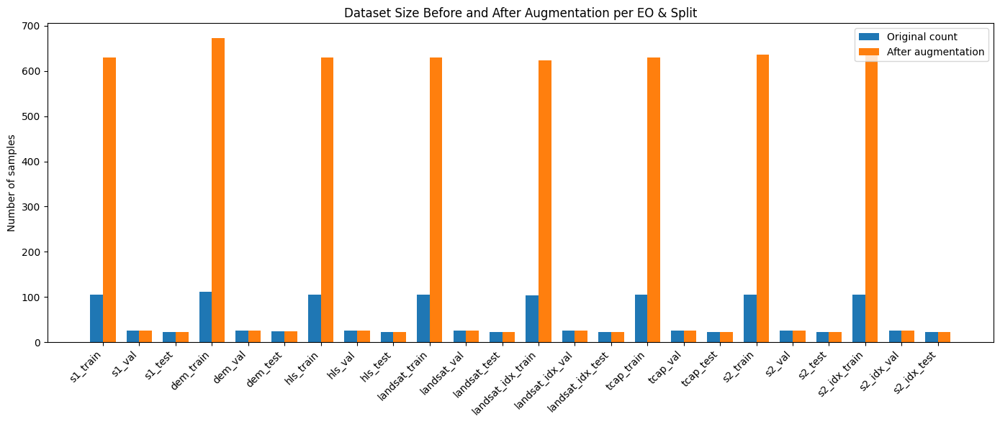

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_augmentation_effect(avg_target_df, eo_list, augmentation_multiplier=5):
    # Count original sample counts per EO and split
    counts = []
    for eo in eo_list:
        for split in ['train', 'val', 'test']:
            mask = avg_target_df['filename'].str.contains(f'{eo}_{split}_')
            count = mask.sum()
            counts.append({'eo': eo, 'split': split, 'original_count': count})

    df_counts = pd.DataFrame(counts)

    # Calculate effective counts after augmentation (only train augmented)
    def effective_count(row):
        if row['split'] == 'train':
            return row['original_count'] * (1 + augmentation_multiplier)
        else:
            return row['original_count']

    df_counts['augmented_count'] = df_counts.apply(effective_count, axis=1)

    print("\nSample counts before and after augmentation (assuming augmentation multiplier={}):".format(augmentation_multiplier))
    print(df_counts)

    # Plotting
    fig, ax = plt.subplots(figsize=(14, 6))
    width = 0.35  # bar width

    x = np.arange(len(df_counts['eo'].unique()) * 3)  # eo * splits in order

    # Group by eo then split order ['train','val','test']
    labels = []
    original_vals = []
    augmented_vals = []

    for eo in eo_list:
        for split in ['train', 'val', 'test']:
            subset = df_counts[(df_counts['eo'] == eo) & (df_counts['split'] == split)]
            labels.append(f"{eo}_{split}")
            if not subset.empty:
                original_vals.append(subset['original_count'].values[0])
                augmented_vals.append(subset['augmented_count'].values[0])
            else:
                original_vals.append(0)
                augmented_vals.append(0)

    ax.bar(x - width/2, original_vals, width, label='Original count')
    ax.bar(x + width/2, augmented_vals, width, label='After augmentation')

    ax.set_ylabel('Number of samples')
    ax.set_title('Dataset Size Before and After Augmentation per EO & Split')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()
    plt.tight_layout()
    plt.show()

    return df_counts

# Usage example, put this before Step 2 in your pipeline script:
augmentation_multiplier = 5  # how many augmentations you want to simulate per training patch
df_stats = plot_augmentation_effect(avg_target_df, eo_list, augmentation_multiplier=augmentation_multiplier)


* Loads EO data per product (like 'landsat', 's1', etc.)

* Augments only the train data to expand it

* Splits data into Train/Test/Val splits (augment train, val for evaluation only)

* Normalizes per band inside the model (learned normalization or per batch)

* Has a ViT model running on 32x32 patches for that EO product

* Has hyperparameters (batch norm, epochs, lr, etc.) tunable with a grid search or similar

* Trains on Train, validates on Test, finally evaluates on Val

* Logs verbose progress, including losses and metrics, plots training loss curves

* After training each EO ViT, extracts embeddings with spatial info on val dataset




===== Processing EO product: s1 =====
[INFO] TRAIN dataset for s1 initialized with 105 tiles.
[INFO] TEST dataset for s1 initialized with 22 tiles.
[INFO] VAL dataset for s1 initialized with 25 tiles.
[INFO] Starting hyperparameter search for s1

[GRID SEARCH] batch_norm=True, lr=0.001, opt=Adam, epochs=5
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 8.8728
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: 

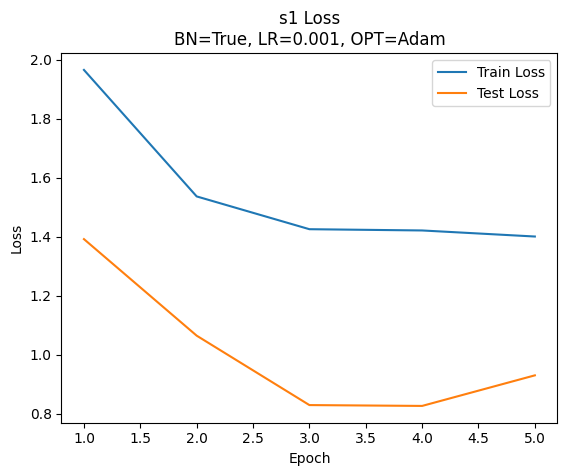


[GRID SEARCH] batch_norm=True, lr=0.001, opt=Adam, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 11.3510
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4

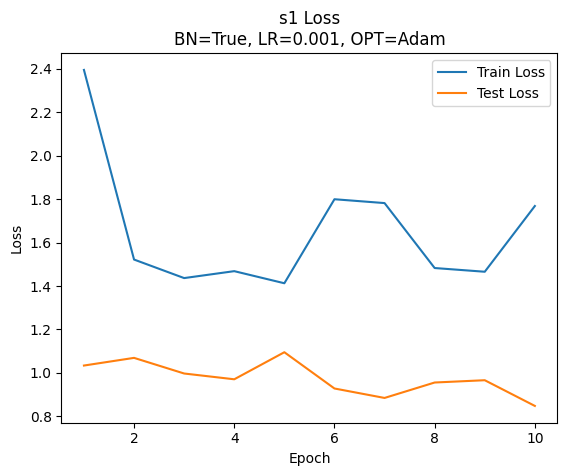


[GRID SEARCH] batch_norm=True, lr=0.001, opt=AdamW, epochs=5
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 5.8422
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 

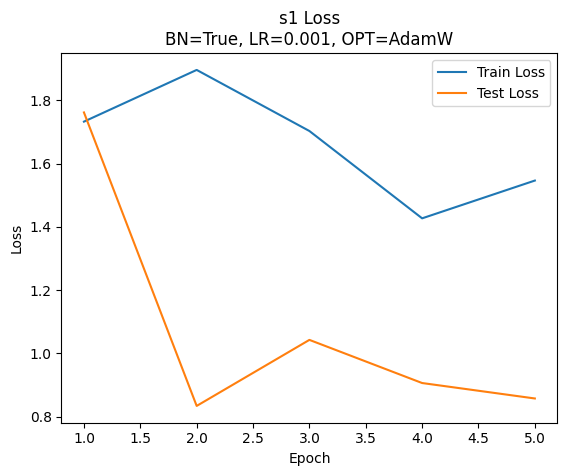


[GRID SEARCH] batch_norm=True, lr=0.001, opt=AdamW, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 4.1546
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4

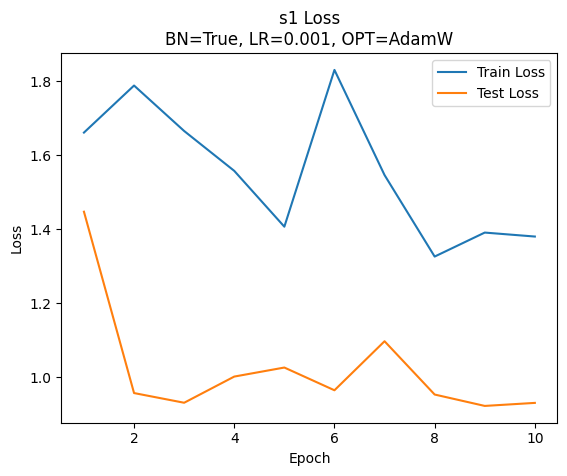


[GRID SEARCH] batch_norm=True, lr=0.0005, opt=Adam, epochs=5
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 6.0760
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 

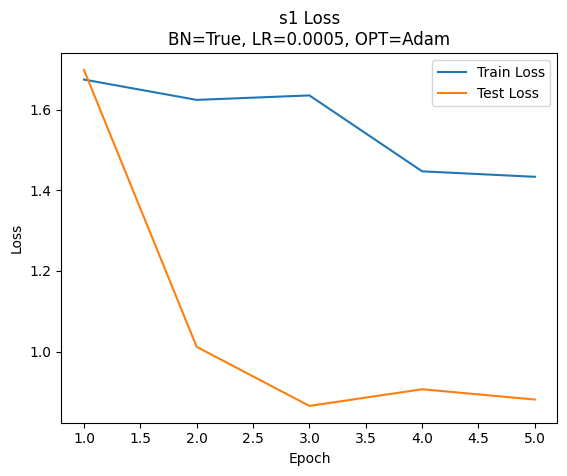


[GRID SEARCH] batch_norm=True, lr=0.0005, opt=Adam, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 3.4550
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4

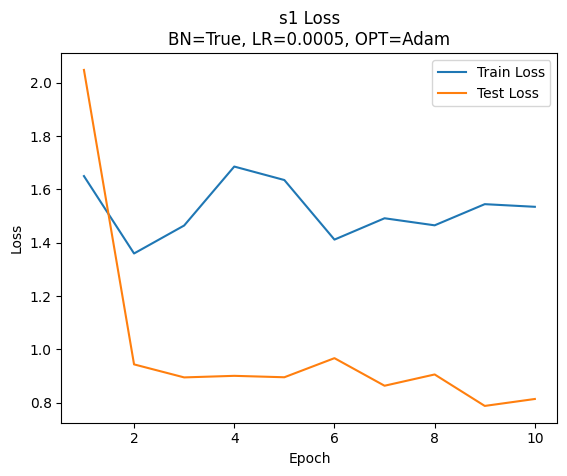


[GRID SEARCH] batch_norm=True, lr=0.0005, opt=AdamW, epochs=5
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 8.2800
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4,

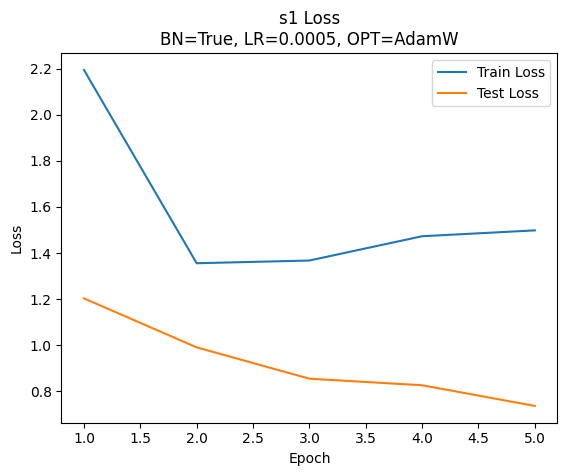


[GRID SEARCH] batch_norm=True, lr=0.0005, opt=AdamW, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 7.0810
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 

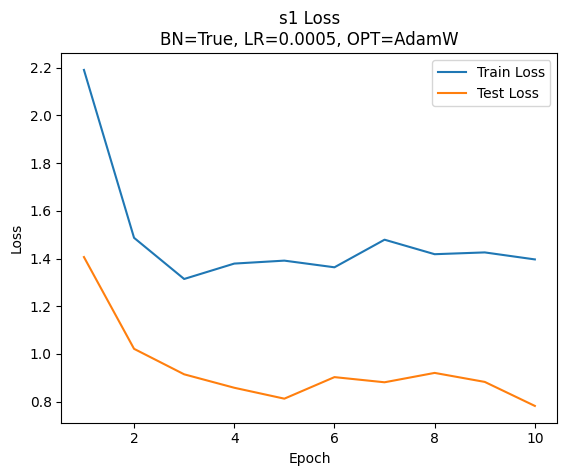


[GRID SEARCH] batch_norm=True, lr=0.0001, opt=Adam, epochs=5
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 14.3439
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4,

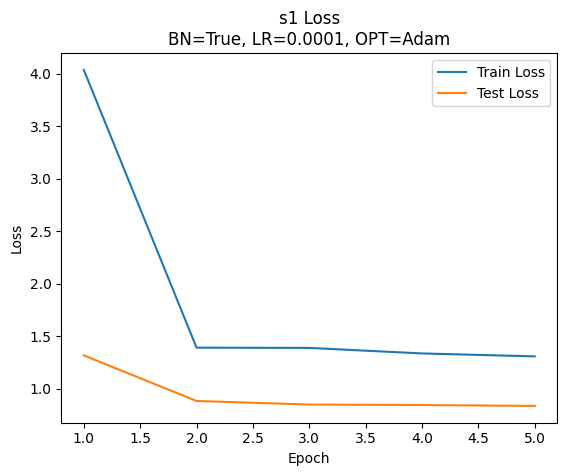


[GRID SEARCH] batch_norm=True, lr=0.0001, opt=Adam, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 3.1016
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4

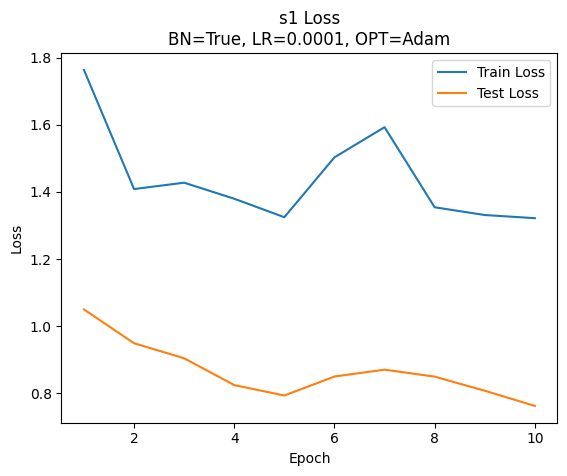


[GRID SEARCH] batch_norm=True, lr=0.0001, opt=AdamW, epochs=5
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 5.2419
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4,

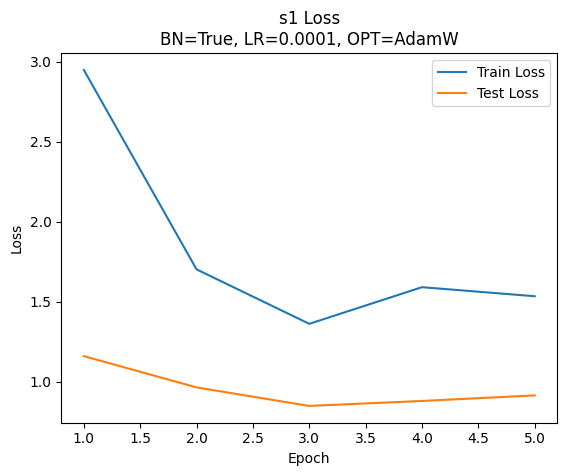


[GRID SEARCH] batch_norm=True, lr=0.0001, opt=AdamW, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 10.6024
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4,

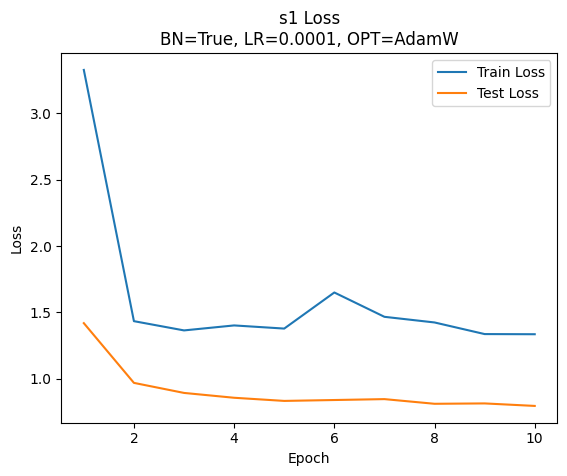


[GRID SEARCH] batch_norm=False, lr=0.001, opt=Adam, epochs=5
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 12.9788
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4

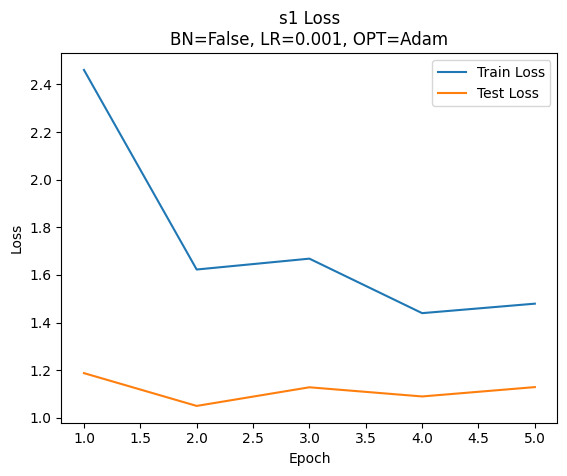


[GRID SEARCH] batch_norm=False, lr=0.001, opt=Adam, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 14.0037
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4,

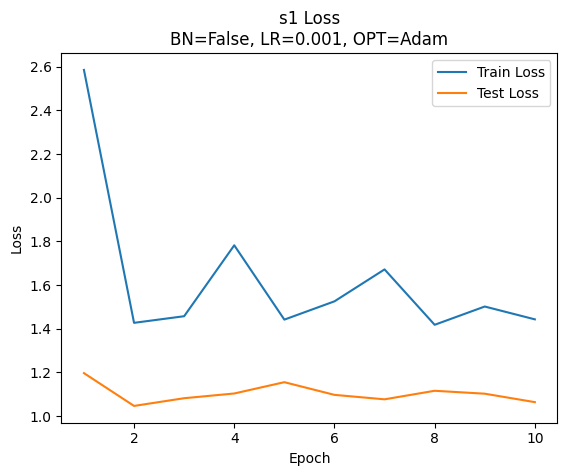


[GRID SEARCH] batch_norm=False, lr=0.001, opt=AdamW, epochs=5
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 4.5145
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4

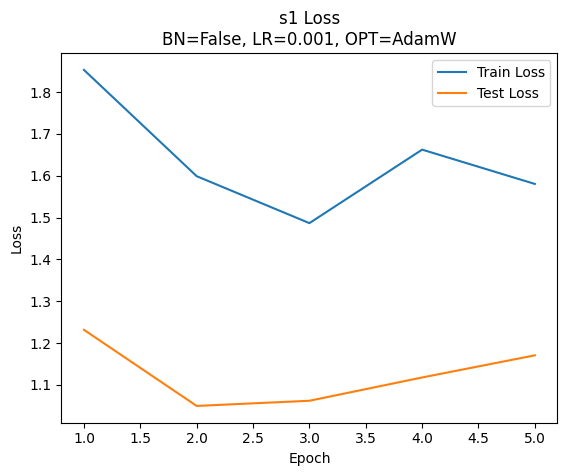


[GRID SEARCH] batch_norm=False, lr=0.001, opt=AdamW, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 5.0794
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4,

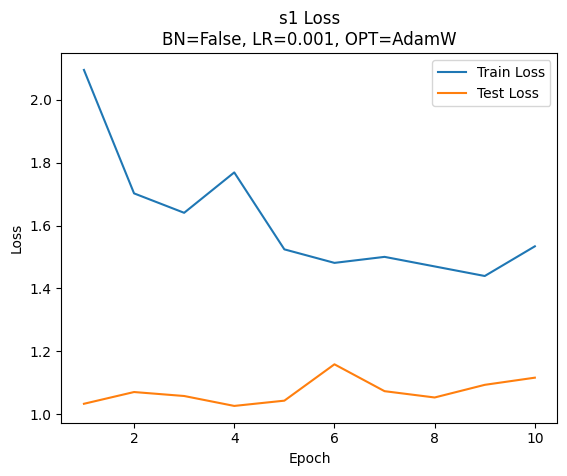


[GRID SEARCH] batch_norm=False, lr=0.0005, opt=Adam, epochs=5
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 7.7148
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4

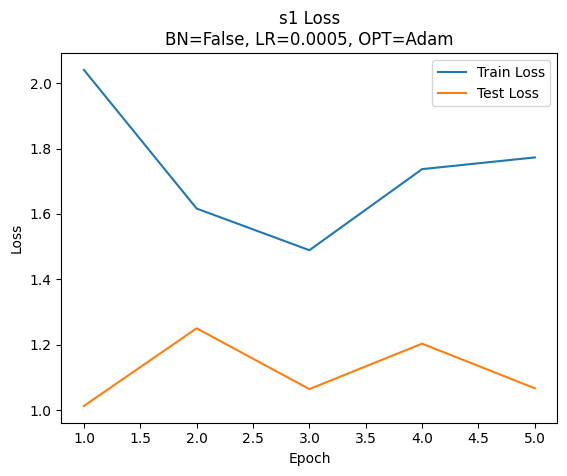


[GRID SEARCH] batch_norm=False, lr=0.0005, opt=Adam, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 13.9208
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4

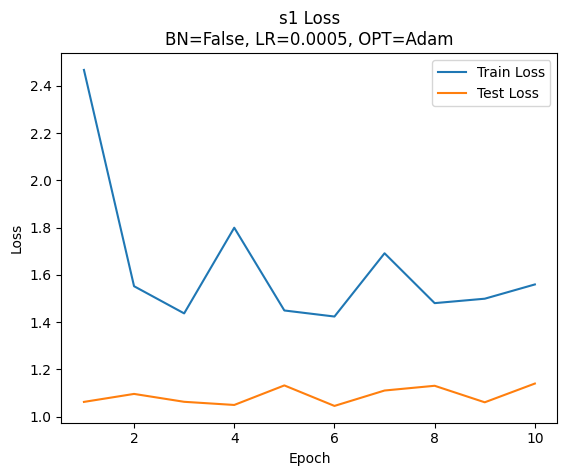


[GRID SEARCH] batch_norm=False, lr=0.0005, opt=AdamW, epochs=5
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 9.4966
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 

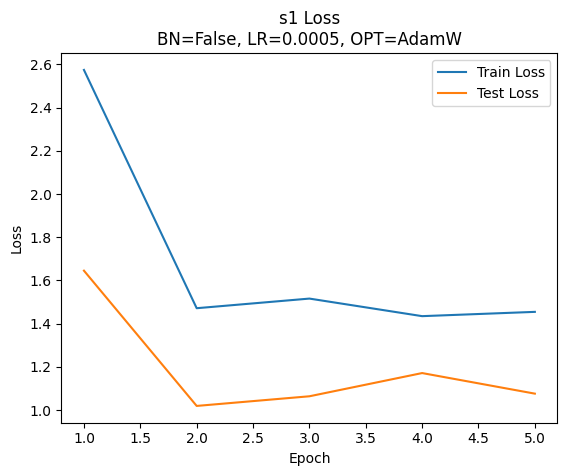


[GRID SEARCH] batch_norm=False, lr=0.0005, opt=AdamW, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 6.1325
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4

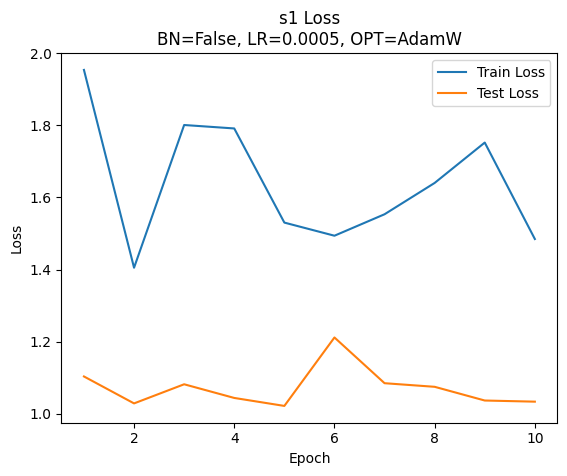


[GRID SEARCH] batch_norm=False, lr=0.0001, opt=Adam, epochs=5
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 3.9679
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4

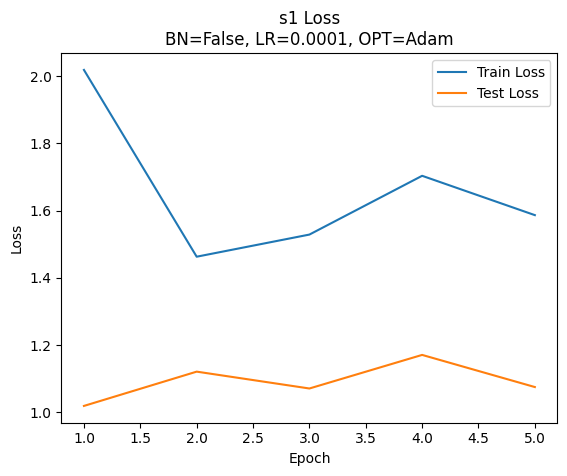


[GRID SEARCH] batch_norm=False, lr=0.0001, opt=Adam, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 6.1074
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4,

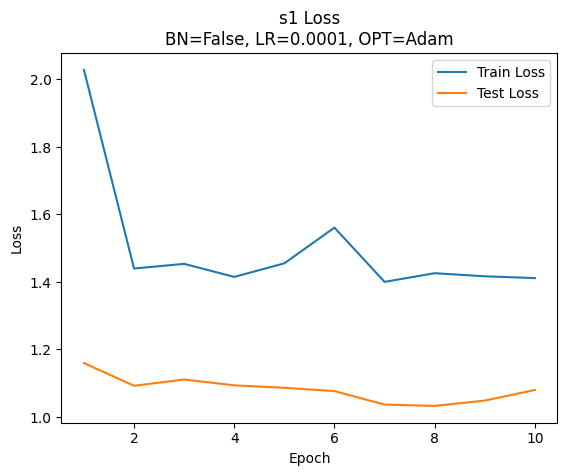


[GRID SEARCH] batch_norm=False, lr=0.0001, opt=AdamW, epochs=5
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 7.4891
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 

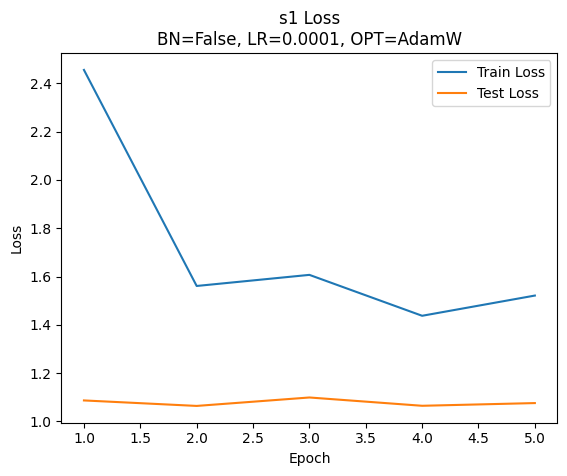


[GRID SEARCH] batch_norm=False, lr=0.0001, opt=AdamW, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/10]
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[TRAIN] Batch 0 Loss: 3.7881
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4

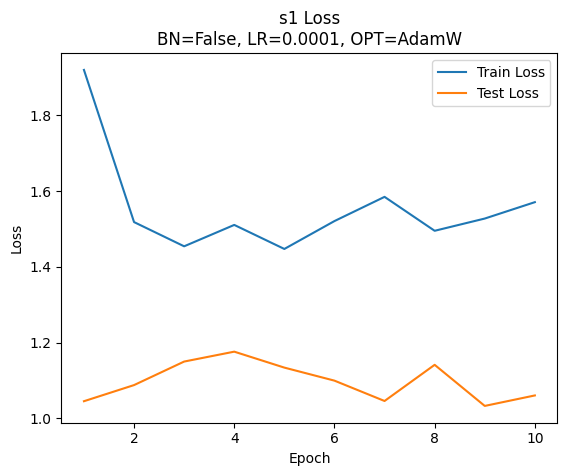

[INFO] Best params for s1: {'batch_norm': True, 'lr': 0.0005, 'epochs': 5, 'optimizer': 'AdamW'} with RMSE=0.8621
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
Element 2: Debug print: input_scaler.weight shape: torch.Size([4, 4, 1, 1])
[EVAL] Avg Loss: 2.2972 RMSE: 1.4667
[FINAL EVAL] Validation Loss: 2.2972, RMSE: 1.4667
[INFO] Extracted 25 embeddings with spatial info for validation.

===== Processing EO product: s2 =====
[INFO] TRAIN dataset for s2 initialized with 106 tiles.
[INFO] TEST dataset for s2 initialized with 22 tiles.
[INFO] VAL dataset for s2 initialized with 26 tiles.
[INFO] Starting hyperparameter search for s2

[GRID SEARCH] batch_norm=True, lr=0.001, opt=Adam, epochs=5
[INFO] Initialized EOViT with batch_norm=True for 6 input channels.
[EPOCH 1/5]
Element 2: Debug print: input_scaler.weig

In [ ]:
#dev

## this block works saving it as is to test the features above

import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import rasterio
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.manifold import TSNE
import torchvision.transforms as T
import torchvision.transforms.functional as TF

# --- EO config ---
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']
bands_per_cov = {
    's1': 4, 's2': 6, 's2_idx': 8,
    'landsat': 6, 'landsat_idx': 7, 'hls': 7,
    'tcap': 6, 'dem': 2
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # --- Augmentation Transform (on-the-fly for train only) ---
# class RandomFlipRotateShift:
#     def __init__(self, max_shift=3):
#         self.max_shift = max_shift

#     def __call__(self, img_tensor):
#         # img_tensor shape: (C, H, W)
#         if random.random() > 0.5:
#             img_tensor = torch.flip(img_tensor, dims=[2])
#         if random.random() > 0.5:
#             img_tensor = torch.flip(img_tensor, dims=[1])
#         k = random.randint(0, 3)
#         img_tensor = torch.rot90(img_tensor, k, dims=[1, 2])

#         shift_x = random.randint(-self.max_shift, self.max_shift)
#         shift_y = random.randint(-self.max_shift, self.max_shift)
#         img_tensor = F.pad(img_tensor, (self.max_shift, self.max_shift, self.max_shift, self.max_shift), mode='reflect')
#         h, w = img_tensor.shape[1], img_tensor.shape[2]
#         start_x = self.max_shift + shift_x
#         start_y = self.max_shift + shift_y
#         img_tensor = img_tensor[:, start_y:start_y+(h - 2*self.max_shift), start_x:start_x+(w - 2*self.max_shift)]

#         return img_tensor


# === Element 1: Robust Augmentation ===
# print("element 1")

class RobustAugmentation:
    def __init__(self, patch_size=32):
        self.patch_size = patch_size
        self.augment = T.Compose([
            T.RandomCrop(patch_size, padding=4, pad_if_needed=True),
            T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
            T.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=10),
            T.RandomHorizontalFlip(),
            T.RandomVerticalFlip(),
            T.RandomApply([T.ElasticTransform(alpha=50.0)], p=0.3)
        ])

    def __call__(self, img_tensor):
        # img_tensor: (C, H, W)
        return self.augment(img_tensor)


# === Element 3: Add Activation Layer ===
# print("element 3")

class ActivatedEOViT(nn.Module):
    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.base_model.input_scaler(x)
        print("Element 2: Debug print: input_scaler.weight shape:", self.base_model.input_scaler.weight.shape)  # Element 2: Debug print
        x = self.base_model.input_norm(x)
        x = self.base_model.patch_embed(x).flatten(2).transpose(1, 2)

        cls_tokens = self.base_model.cls_token.expand(x.size(0), -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.base_model.pos_embed

        x = self.base_model.transformer(x)
        x = self.activation(x[:, 0])
        return self.base_model.mlp_head(x).squeeze(1)

    def extract_cls_embeddings(self, x):
        return self.base_model.extract_cls_embeddings(x)


# --- Dataset ---
class EODataset(Dataset):
    def __init__(self, eo_name, data_dir, split, target_df, patch_size=32, transform=None):
        self.eo_name = eo_name
        self.data_dir = data_dir
        self.split = split
        self.patch_size = patch_size
        self.target_df = target_df
        self.transform = transform

        all_files = sorted([f for f in os.listdir(data_dir)
                            if f.startswith(f"{eo_name}_{split}_") and f.endswith(".tif")])
        target_files = set(target_df['filename'])
        self.files = [f for f in all_files if f in target_files]

        print(f"[INFO] {split.upper()} dataset for {eo_name} initialized with {len(self.files)} tiles.")

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        filename = self.files[idx]
        filepath = os.path.join(self.data_dir, filename)

        with rasterio.open(filepath) as src:
            array_resized = src.read(
                out_shape=(src.count, self.patch_size, self.patch_size),
                resampling=rasterio.enums.Resampling.bilinear
            )
            bounds = src.bounds
            x_center = (bounds.left + bounds.right) / 2
            y_center = (bounds.top + bounds.bottom) / 2

        img_tensor = torch.from_numpy(array_resized).float()

        if self.transform is not None and self.split == 'train':
            img_tensor = self.transform(img_tensor)

        row = self.target_df[self.target_df['filename'] == filename]
        target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
        target_tensor = torch.tensor(target, dtype=torch.float32)
        spatial_tensor = torch.tensor([x_center, y_center], dtype=torch.float32)

        return img_tensor, target_tensor, spatial_tensor


# --- Vision Transformer Model ---
class EOViT(nn.Module):
    def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32, batch_norm=True):
        super().__init__()
        self.batch_norm = batch_norm
        self.input_scaler = nn.Conv2d(in_channels, in_channels, kernel_size=1, stride=1, padding=0, bias=True)
        self.input_norm = nn.BatchNorm2d(in_channels) if batch_norm else nn.Identity()
        self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)

        num_patches = (patch_dim // patch_size) ** 2
        self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
        self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))

        encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

        print(f"[INFO] Initialized EOViT with batch_norm={batch_norm} for {in_channels} input channels.")

    def forward(self, x):
        x = self.input_scaler(x)
        x = self.input_norm(x)
        x = self.patch_embed(x).flatten(2).transpose(1, 2)

        cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed

        x = self.transformer(x)
        return self.mlp_head(x[:, 0]).squeeze(1)

    def extract_cls_embeddings(self, x):
        x = self.input_scaler(x)
        x = self.input_norm(x)
        x = self.patch_embed(x).flatten(2).transpose(1, 2)
        cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.transformer(x)
        return x[:, 0]


# --- Training / Evaluation Loop ---
def train_one_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for batch_idx, (x, y, _) in enumerate(dataloader):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        outputs = model(x)
        loss = criterion(outputs, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"[TRAIN] Batch {batch_idx} Loss: {loss.item():.4f}")

    avg_loss = running_loss / len(dataloader)
    print(f"[TRAIN] Epoch Avg Loss: {avg_loss:.4f}")
    return avg_loss


def evaluate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    preds, trues = [], []
    with torch.no_grad():
        for x, y, _ in dataloader:
            x, y = x.to(device), y.to(device)
            outputs = model(x)
            loss = criterion(outputs, y)
            running_loss += loss.item()
            preds.append(outputs.cpu().numpy())
            trues.append(y.cpu().numpy())
    avg_loss = running_loss / len(dataloader)
    preds = np.concatenate(preds)
    trues = np.concatenate(trues)
    rmse = np.sqrt(mean_squared_error(trues, preds))
    print(f"[EVAL] Avg Loss: {avg_loss:.4f} RMSE: {rmse:.4f}")
    return avg_loss, rmse


# # --- Hyperparameter grid search ---
# def hyperparameter_search(eo, train_dataset, test_dataset, batch_size=8, epochs=10, device='cpu'):
#     print(f"[INFO] Starting hyperparameter search for {eo}")
#     # Simple grid search for batch_norm, learning rate, epochs
#     best_rmse = float('inf')
#     best_params = None
#     best_model = None

#     batch_norm_options = [True, False]
#     lr_options = [1e-3, 1e-4]
#     epoch_options = [10]  # You can extend this

#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     test_loader = DataLoader(test_dataset, batch_size=batch_size)

#     for batch_norm in batch_norm_options:
#         for lr in lr_options:
#             for n_epochs in epoch_options:
#                 print(f"\n[GRID SEARCH] batch_norm={batch_norm}, lr={lr}, epochs={n_epochs}")

#                 model = EOViT(
#                     in_channels=bands_per_cov[eo],
#                     patch_size=16,
#                     emb_dim=64,
#                     num_heads=4,
#                     num_layers=2,
#                     patch_dim=train_dataset.patch_size,
#                     batch_norm=batch_norm
#                 ).to(device)

#                 optimizer = torch.optim.Adam(model.parameters(), lr=lr)
#                 criterion = nn.MSELoss()

#                 train_losses = []
#                 test_losses = []
#                 for epoch in range(n_epochs):
#                     print(f"[EPOCH {epoch+1}/{n_epochs}]")
#                     train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
#                     test_loss, test_rmse = evaluate(model, test_loader, criterion, device)
#                     train_losses.append(train_loss)
#                     test_losses.append(test_loss)

#                 # Plot losses
#                 plt.figure()
#                 plt.plot(range(1, n_epochs+1), train_losses, label='Train Loss')
#                 plt.plot(range(1, n_epochs+1), test_losses, label='Test Loss')
#                 plt.title(f'{eo} Training & Test Loss\nBatchNorm={batch_norm}, LR={lr}')
#                 plt.xlabel('Epoch')
#                 plt.ylabel('Loss')
#                 plt.legend()
#                 plt.show()

#                 if test_rmse < best_rmse:
#                     best_rmse = test_rmse
#                     best_params = {'batch_norm': batch_norm, 'lr': lr, 'epochs': n_epochs}
#                     best_model = model

#     print(f"[INFO] Best params for {eo}: {best_params} with RMSE={best_rmse:.4f}")
#     return best_model, best_params


# === Element 4: Expanded hyperparameter search ===
def hyperparameter_search(eo, train_dataset, test_dataset, batch_size=8, epochs=10, device='cpu'):
    print(f"[INFO] Starting hyperparameter search for {eo}")
    best_rmse = float('inf')
    best_params = None
    best_model = None

    batch_norm_options = [True, False]
    lr_options = [1e-3, 5e-4, 1e-4]
    epoch_options = [5, 10]
    optimizers = ['Adam', 'AdamW']

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size)

    for batch_norm in batch_norm_options:
        for lr in lr_options:
            for opt_name in optimizers:
                for n_epochs in epoch_options:
                    print(f"\n[GRID SEARCH] batch_norm={batch_norm}, lr={lr}, opt={opt_name}, epochs={n_epochs}")
                    base_model = EOViT(
                        in_channels=bands_per_cov[eo],
                        patch_size=16,
                        emb_dim=64,
                        num_heads=4,
                        num_layers=2,
                        patch_dim=train_dataset.patch_size,
                        batch_norm=batch_norm
                    ).to(device)

                    model = ActivatedEOViT(base_model).to(device)

                    optimizer = torch.optim.Adam(model.parameters(), lr=lr) if opt_name == 'Adam' \
                        else torch.optim.AdamW(model.parameters(), lr=lr)
                    criterion = nn.MSELoss()

                    train_losses, test_losses = [], []
                    for epoch in range(n_epochs):
                        print(f"[EPOCH {epoch+1}/{n_epochs}]")
                        train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
                        test_loss, test_rmse = evaluate(model, test_loader, criterion, device)
                        train_losses.append(train_loss)
                        test_losses.append(test_loss)

                    plt.figure()
                    plt.plot(range(1, n_epochs+1), train_losses, label='Train Loss')
                    plt.plot(range(1, n_epochs+1), test_losses, label='Test Loss')
                    plt.title(f'{eo} Loss\nBN={batch_norm}, LR={lr}, OPT={opt_name}')
                    plt.xlabel('Epoch')
                    plt.ylabel('Loss')
                    plt.legend()
                    plt.show()

                    if test_rmse < best_rmse:
                        best_rmse = test_rmse
                        best_params = {
                            'batch_norm': batch_norm,
                            'lr': lr,
                            'epochs': n_epochs,
                            'optimizer': opt_name
                        }
                        best_model = model

    print(f"[INFO] Best params for {eo}: {best_params} with RMSE={best_rmse:.4f}")
    return best_model, best_params


# --- Extract embeddings and spatial info for val set ---
def extract_embeddings_and_spatial(model, dataloader, device):
    model.eval()
    all_embeddings, all_targets, all_coords = [], [], []

    with torch.no_grad():
        for x, y, coord in dataloader:
            x = x.to(device)
            emb = model.extract_cls_embeddings(x).cpu()
            all_embeddings.append(emb)
            all_targets.append(y)
            all_coords.append(coord)

    embeddings = torch.cat(all_embeddings, dim=0).numpy()
    targets = torch.cat(all_targets, dim=0).numpy()
    coords = torch.cat(all_coords, dim=0).numpy()

    print(f"[INFO] Extracted {len(embeddings)} embeddings with spatial info for validation.")
    return embeddings, targets, coords


# --- Main pipeline ---
def main_pipeline(data_root_dir, avg_target_df, patch_size=32, batch_size=8):
    embedding_dict = {}
    augmentation_transform = RandomFlipRotateShift(max_shift=3)

    for eo in eo_list:
        print(f"\n===== Processing EO product: {eo} =====")

        # Prepare dataframes filtered by EO and split
        eo_train_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_train_')]
        eo_val_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_val_')]
        eo_test_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_test_')]

        # Construct datasets
        train_dataset = EODataset(eo, data_root_dir, 'train', eo_train_df, patch_size=patch_size, transform=augmentation_transform)
        test_dataset = EODataset(eo, data_root_dir, 'test', eo_test_df, patch_size=patch_size, transform=None)
        val_dataset = EODataset(eo, data_root_dir, 'val', eo_val_df, patch_size=patch_size, transform=None)

        # Hyperparameter tuning & train best model on train/test splits
        default_epochs = 10
        best_model, best_params = hyperparameter_search(eo, train_dataset, test_dataset, batch_size=batch_size, epochs=default_epochs, device=device)

        # best_model, best_params = hyperparameter_search(eo, train_dataset, test_dataset, batch_size=batch_size, epochs=best_params.get('epochs', 10), device=device)

        # Final evaluation on validation dataset with best model
        val_loader = DataLoader(val_dataset, batch_size=batch_size)
        criterion = nn.MSELoss()
        val_loss, val_rmse = evaluate(best_model, val_loader, criterion, device)
        print(f"[FINAL EVAL] Validation Loss: {val_loss:.4f}, RMSE: {val_rmse:.4f}")

        # Extract embeddings + spatial info on val set
        embedding, targets, coords = extract_embeddings_and_spatial(best_model, val_loader, device)
        embedding_dict[eo] = {
            'model': best_model,
            'params': best_params,
            'val_loss': val_loss,
            'val_rmse': val_rmse,
            'embeddings': embedding,
            'targets': targets,
            'coords': coords
        }

    print("[INFO] Completed training and embedding extraction for all EO products.")
    return embedding_dict


# === USAGE EXAMPLE ===
# Make sure avg_target_df is a DataFrame with columns ['filename', 'avg_pai']
data_root_dir = data_dir
embedding_dict = main_pipeline(data_root_dir, avg_target_df)




===== Processing EO product: s1 =====
[INFO] TRAIN dataset for s1 initialized with 105 tiles.
[INFO] TEST dataset for s1 initialized with 22 tiles.
[INFO] VAL dataset for s1 initialized with 25 tiles.
[INFO] Starting hyperparameter search for s1

[GRID SEARCH] batch_norm=True, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 14.5745
[TRAIN] Batch 10 Loss: 2.4495
[TRAIN] Epoch Avg Loss: 2.7665
[EVAL] Avg Loss: 1.0010 RMSE: 0.9925
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.6049
[TRAIN] Batch 10 Loss: 1.9151
[TRAIN] Epoch Avg Loss: 1.7437
[EVAL] Avg Loss: 1.1584 RMSE: 1.0784
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 0.7469
[TRAIN] Batch 10 Loss: 0.8167
[TRAIN] Epoch Avg Loss: 1.3020
[EVAL] Avg Loss: 0.8300 RMSE: 0.9100
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 0.5992
[TRAIN] Batch 10 Loss: 1.0818
[TRAIN] Epoch Avg Loss: 1.4915
[EVAL] Avg Loss: 0.8161 RMSE: 0.9061
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 0.8932
[TRAIN] Batch 10 Loss: 1.4476


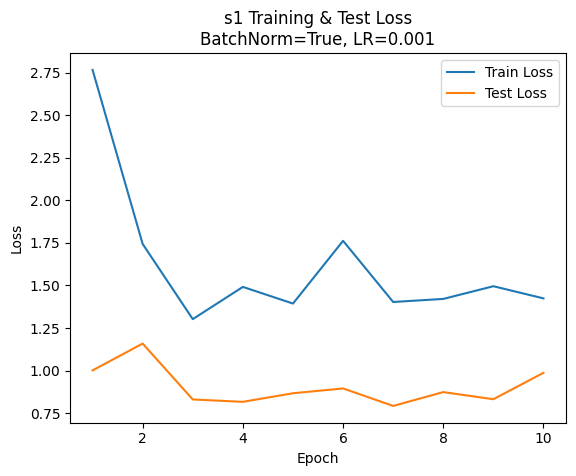


[GRID SEARCH] batch_norm=True, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 4 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.4147
[TRAIN] Batch 10 Loss: 1.2232
[TRAIN] Epoch Avg Loss: 2.8279
[EVAL] Avg Loss: 0.9922 RMSE: 0.9814
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.9800
[TRAIN] Batch 10 Loss: 1.1950
[TRAIN] Epoch Avg Loss: 1.5020
[EVAL] Avg Loss: 0.9324 RMSE: 0.9566
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 3.1024
[TRAIN] Batch 10 Loss: 1.3250
[TRAIN] Epoch Avg Loss: 1.3694
[EVAL] Avg Loss: 0.8777 RMSE: 0.9354
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.2295
[TRAIN] Batch 10 Loss: 0.9626
[TRAIN] Epoch Avg Loss: 1.2953
[EVAL] Avg Loss: 0.7953 RMSE: 0.8951
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.6164
[TRAIN] Batch 10 Loss: 1.0058
[TRAIN] Epoch Avg Loss: 1.3847
[EVAL] Avg Loss: 0.8039 RMSE: 0.9013
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.6763
[TRAIN] Batch 10 Loss: 1.8820
[TRAIN] Epoch Avg Loss: 1.5814
[EVAL] Avg Loss: 0.8500 RMSE: 0.9250
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.99

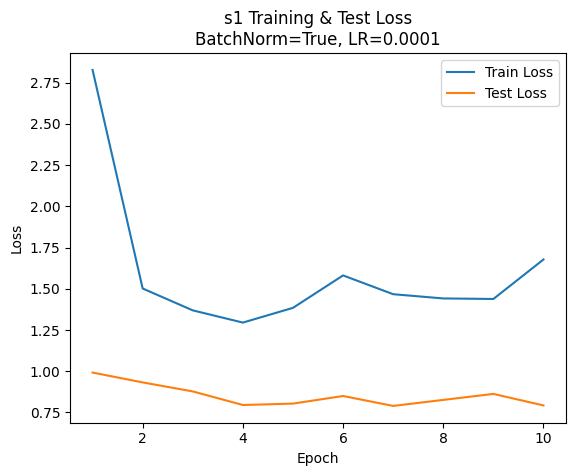


[GRID SEARCH] batch_norm=False, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.5311
[TRAIN] Batch 10 Loss: 1.0212
[TRAIN] Epoch Avg Loss: 2.3455
[EVAL] Avg Loss: 1.0344 RMSE: 1.0023
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 0.6117
[TRAIN] Batch 10 Loss: 1.8721
[TRAIN] Epoch Avg Loss: 1.8905
[EVAL] Avg Loss: 1.0642 RMSE: 1.0181
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.5437
[TRAIN] Batch 10 Loss: 1.3909
[TRAIN] Epoch Avg Loss: 1.5496
[EVAL] Avg Loss: 1.1153 RMSE: 1.0443
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.3951
[TRAIN] Batch 10 Loss: 1.4731
[TRAIN] Epoch Avg Loss: 1.5260
[EVAL] Avg Loss: 1.1008 RMSE: 1.0370
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.9981
[TRAIN] Batch 10 Loss: 0.7721
[TRAIN] Epoch Avg Loss: 1.4494
[EVAL] Avg Loss: 1.0344 RMSE: 1.0019
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 0.4753
[TRAIN] Batch 10 Loss: 1.5284
[TRAIN] Epoch Avg Loss: 1.5466
[EVAL] Avg Loss: 1.2054 RMSE: 1.0882
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.0

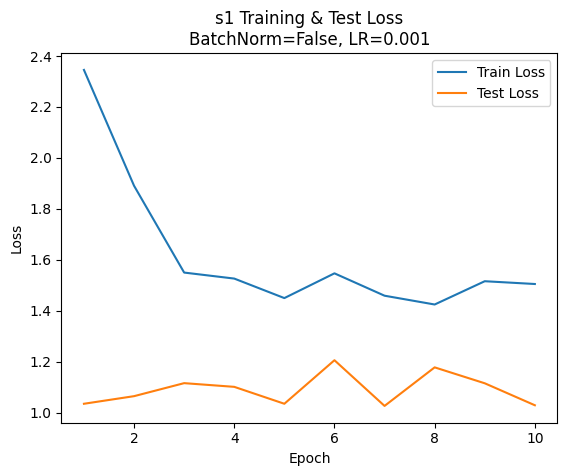


[GRID SEARCH] batch_norm=False, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 4 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.7585
[TRAIN] Batch 10 Loss: 1.7918
[TRAIN] Epoch Avg Loss: 2.2606
[EVAL] Avg Loss: 1.0230 RMSE: 0.9939
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 0.9711
[TRAIN] Batch 10 Loss: 1.0400
[TRAIN] Epoch Avg Loss: 1.4429
[EVAL] Avg Loss: 1.1597 RMSE: 1.0675
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 2.5216
[TRAIN] Batch 10 Loss: 0.9361
[TRAIN] Epoch Avg Loss: 1.7121
[EVAL] Avg Loss: 1.1146 RMSE: 1.0453
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.4623
[TRAIN] Batch 10 Loss: 1.7472
[TRAIN] Epoch Avg Loss: 1.4411
[EVAL] Avg Loss: 1.0324 RMSE: 1.0027
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 2.8129
[TRAIN] Batch 10 Loss: 1.0483
[TRAIN] Epoch Avg Loss: 1.4207
[EVAL] Avg Loss: 1.1279 RMSE: 1.0523
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.5743
[TRAIN] Batch 10 Loss: 1.6848
[TRAIN] Epoch Avg Loss: 1.4670
[EVAL] Avg Loss: 1.0736 RMSE: 1.0251
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 2.

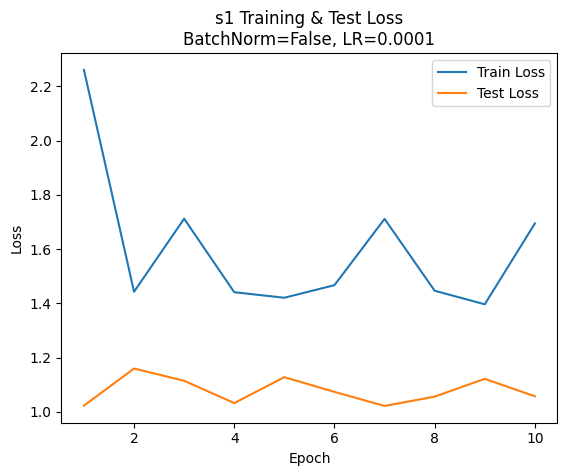

[INFO] Best params for s1: {'batch_norm': True, 'lr': 0.0001, 'epochs': 10} with RMSE=0.8949
[EVAL] Avg Loss: 2.2104 RMSE: 1.4778
[FINAL EVAL] Validation Loss: 2.2104, RMSE: 1.4778
[INFO] Extracted 25 embeddings with spatial info for validation.

===== Processing EO product: s2 =====
[INFO] TRAIN dataset for s2 initialized with 106 tiles.
[INFO] TEST dataset for s2 initialized with 22 tiles.
[INFO] VAL dataset for s2 initialized with 26 tiles.
[INFO] Starting hyperparameter search for s2

[GRID SEARCH] batch_norm=True, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.0567
[TRAIN] Batch 10 Loss: 2.1825
[TRAIN] Epoch Avg Loss: 2.3089
[EVAL] Avg Loss: 1.2136 RMSE: 1.0909
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 2.3546
[TRAIN] Batch 10 Loss: 1.3183
[TRAIN] Epoch Avg Loss: 1.5519
[EVAL] Avg Loss: 1.0765 RMSE: 1.0225
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.6835
[TRAIN] Batch 10 Loss: 1.3999
[TRAIN] Epoch Avg Loss: 1.4412
[EVA

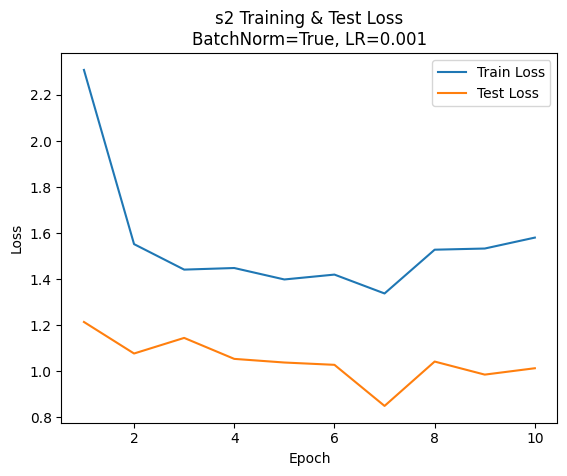


[GRID SEARCH] batch_norm=True, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.4610
[TRAIN] Batch 10 Loss: 2.1536
[TRAIN] Epoch Avg Loss: 2.3017
[EVAL] Avg Loss: 1.1578 RMSE: 1.0555
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.8593
[TRAIN] Batch 10 Loss: 1.6672
[TRAIN] Epoch Avg Loss: 1.5622
[EVAL] Avg Loss: 1.0986 RMSE: 1.0346
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.4358
[TRAIN] Batch 10 Loss: 1.2521
[TRAIN] Epoch Avg Loss: 1.3929
[EVAL] Avg Loss: 1.1170 RMSE: 1.0439
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 2.1169
[TRAIN] Batch 10 Loss: 0.9249
[TRAIN] Epoch Avg Loss: 1.5907
[EVAL] Avg Loss: 1.0609 RMSE: 1.0146
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.0082
[TRAIN] Batch 10 Loss: 1.3023
[TRAIN] Epoch Avg Loss: 1.5681
[EVAL] Avg Loss: 1.0853 RMSE: 1.0299
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 0.8626
[TRAIN] Batch 10 Loss: 2.3841
[TRAIN] Epoch Avg Loss: 1.3657
[EVAL] Avg Loss: 1.0117 RMSE: 0.9922
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.32

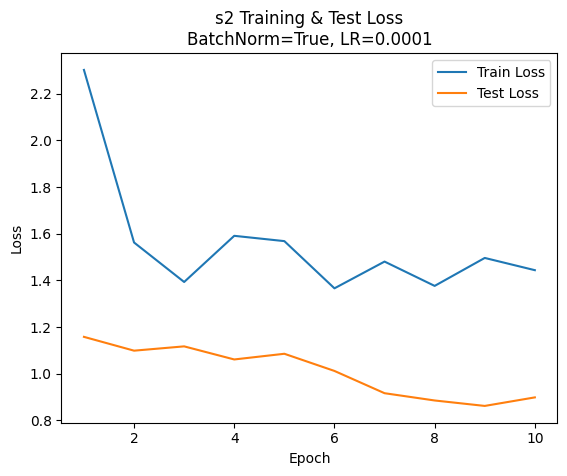


[GRID SEARCH] batch_norm=False, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 4.0843
[TRAIN] Batch 10 Loss: 1.4987
[TRAIN] Epoch Avg Loss: 2.2641
[EVAL] Avg Loss: 1.0644 RMSE: 1.0144
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.3733
[TRAIN] Batch 10 Loss: 1.1726
[TRAIN] Epoch Avg Loss: 1.6201
[EVAL] Avg Loss: 1.2388 RMSE: 1.1028
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.9223
[TRAIN] Batch 10 Loss: 0.8599
[TRAIN] Epoch Avg Loss: 1.5853
[EVAL] Avg Loss: 1.0761 RMSE: 1.0220
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 0.9098
[TRAIN] Batch 10 Loss: 1.8314
[TRAIN] Epoch Avg Loss: 1.6014
[EVAL] Avg Loss: 1.1820 RMSE: 1.0757
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.0674
[TRAIN] Batch 10 Loss: 1.1850
[TRAIN] Epoch Avg Loss: 1.5507
[EVAL] Avg Loss: 1.1603 RMSE: 1.0651
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.0762
[TRAIN] Batch 10 Loss: 1.6902
[TRAIN] Epoch Avg Loss: 1.5022
[EVAL] Avg Loss: 1.1174 RMSE: 1.0437
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.6

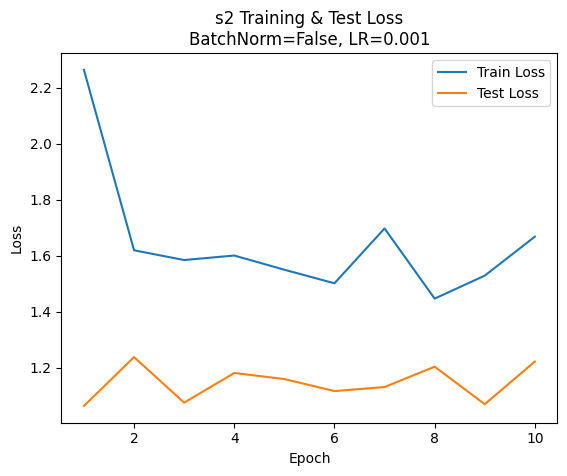


[GRID SEARCH] batch_norm=False, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 11.5058
[TRAIN] Batch 10 Loss: 1.9567
[TRAIN] Epoch Avg Loss: 3.1417
[EVAL] Avg Loss: 1.2210 RMSE: 1.0838
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 3.3375
[TRAIN] Batch 10 Loss: 0.5368
[TRAIN] Epoch Avg Loss: 1.8606
[EVAL] Avg Loss: 1.1569 RMSE: 1.0635
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.5143
[TRAIN] Batch 10 Loss: 2.3077
[TRAIN] Epoch Avg Loss: 1.5897
[EVAL] Avg Loss: 1.2537 RMSE: 1.1097
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 2.1438
[TRAIN] Batch 10 Loss: 2.1107
[TRAIN] Epoch Avg Loss: 1.5803
[EVAL] Avg Loss: 1.1930 RMSE: 1.0811
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.2119
[TRAIN] Batch 10 Loss: 1.0792
[TRAIN] Epoch Avg Loss: 1.5136
[EVAL] Avg Loss: 1.0759 RMSE: 1.0219
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.3563
[TRAIN] Batch 10 Loss: 1.3666
[TRAIN] Epoch Avg Loss: 1.4496
[EVAL] Avg Loss: 1.2368 RMSE: 1.1019
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1

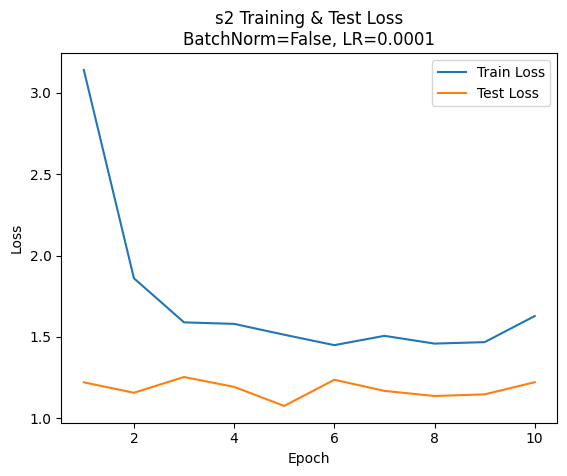

[INFO] Best params for s2: {'batch_norm': True, 'lr': 0.0001, 'epochs': 10} with RMSE=0.9477
[EVAL] Avg Loss: 2.1446 RMSE: 1.4831
[FINAL EVAL] Validation Loss: 2.1446, RMSE: 1.4831
[INFO] Extracted 26 embeddings with spatial info for validation.

===== Processing EO product: landsat =====
[INFO] TRAIN dataset for landsat initialized with 105 tiles.
[INFO] TEST dataset for landsat initialized with 22 tiles.
[INFO] VAL dataset for landsat initialized with 25 tiles.
[INFO] Starting hyperparameter search for landsat

[GRID SEARCH] batch_norm=True, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.0298
[TRAIN] Batch 10 Loss: 0.6858
[TRAIN] Epoch Avg Loss: 2.0014
[EVAL] Avg Loss: 1.0383 RMSE: 0.9918
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 3.8725
[TRAIN] Batch 10 Loss: 0.8303
[TRAIN] Epoch Avg Loss: 1.9464
[EVAL] Avg Loss: 1.1924 RMSE: 1.0768
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 2.1500
[TRAIN] Batch 10 Loss: 1.6895
[TRAIN] Ep

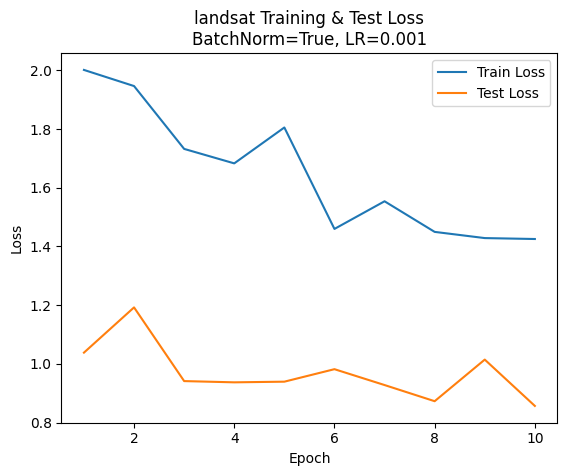


[GRID SEARCH] batch_norm=True, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 3.4160
[TRAIN] Batch 10 Loss: 2.3042
[TRAIN] Epoch Avg Loss: 1.6377
[EVAL] Avg Loss: 1.0336 RMSE: 0.9896
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 0.5145
[TRAIN] Batch 10 Loss: 1.7801
[TRAIN] Epoch Avg Loss: 1.4214
[EVAL] Avg Loss: 1.0325 RMSE: 0.9971
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.2731
[TRAIN] Batch 10 Loss: 1.6261
[TRAIN] Epoch Avg Loss: 1.4194
[EVAL] Avg Loss: 1.0066 RMSE: 0.9832
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 0.7563
[TRAIN] Batch 10 Loss: 1.0719
[TRAIN] Epoch Avg Loss: 1.5305
[EVAL] Avg Loss: 1.0568 RMSE: 1.0096
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.5373
[TRAIN] Batch 10 Loss: 2.3874
[TRAIN] Epoch Avg Loss: 1.7374
[EVAL] Avg Loss: 1.0079 RMSE: 0.9843
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 0.7585
[TRAIN] Batch 10 Loss: 2.2498
[TRAIN] Epoch Avg Loss: 1.5081
[EVAL] Avg Loss: 0.8770 RMSE: 0.9126
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 0.68

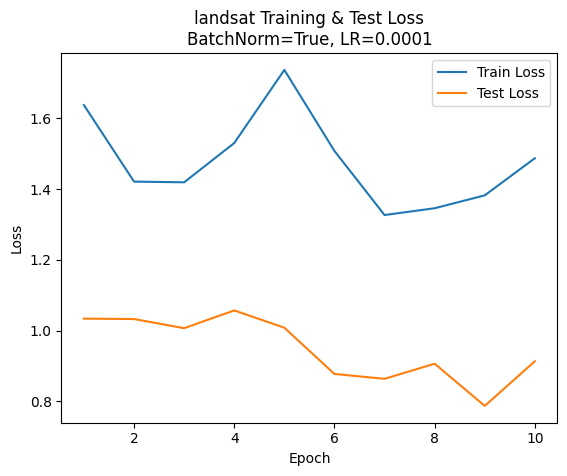


[GRID SEARCH] batch_norm=False, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 5.3717
[TRAIN] Batch 10 Loss: 2.4539
[TRAIN] Epoch Avg Loss: 2.0829
[EVAL] Avg Loss: 1.0772 RMSE: 1.0201
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.4202
[TRAIN] Batch 10 Loss: 1.9874
[TRAIN] Epoch Avg Loss: 1.6552
[EVAL] Avg Loss: 1.0839 RMSE: 1.0235
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.0379
[TRAIN] Batch 10 Loss: 1.6449
[TRAIN] Epoch Avg Loss: 1.5474
[EVAL] Avg Loss: 1.1410 RMSE: 1.0519
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 0.9426
[TRAIN] Batch 10 Loss: 3.1479
[TRAIN] Epoch Avg Loss: 1.5183
[EVAL] Avg Loss: 0.9813 RMSE: 0.9696
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 2.4762
[TRAIN] Batch 10 Loss: 2.4960
[TRAIN] Epoch Avg Loss: 1.5538
[EVAL] Avg Loss: 1.2329 RMSE: 1.0959
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.7706
[TRAIN] Batch 10 Loss: 1.9699
[TRAIN] Epoch Avg Loss: 1.5307
[EVAL] Avg Loss: 1.0384 RMSE: 1.0001
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.6

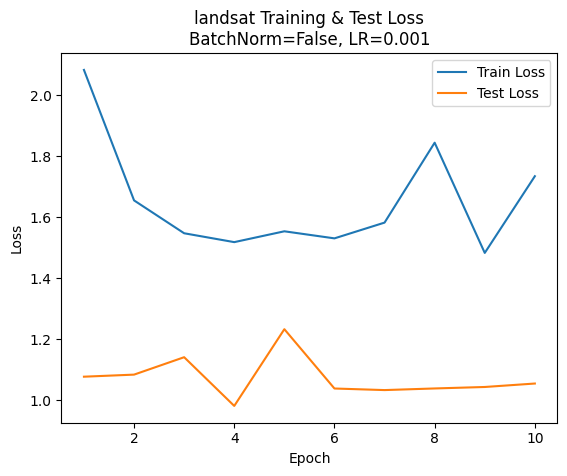


[GRID SEARCH] batch_norm=False, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 12.2499
[TRAIN] Batch 10 Loss: 1.1206
[TRAIN] Epoch Avg Loss: 3.4284
[EVAL] Avg Loss: 1.0246 RMSE: 0.9852
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 3.7091
[TRAIN] Batch 10 Loss: 1.5621
[TRAIN] Epoch Avg Loss: 1.7852
[EVAL] Avg Loss: 1.0417 RMSE: 1.0018
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.4425
[TRAIN] Batch 10 Loss: 0.9403
[TRAIN] Epoch Avg Loss: 1.4567
[EVAL] Avg Loss: 1.1033 RMSE: 1.0332
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.6542
[TRAIN] Batch 10 Loss: 2.6017
[TRAIN] Epoch Avg Loss: 1.4042
[EVAL] Avg Loss: 1.0371 RMSE: 0.9994
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.6689
[TRAIN] Batch 10 Loss: 1.1407
[TRAIN] Epoch Avg Loss: 1.5331
[EVAL] Avg Loss: 1.0606 RMSE: 1.0116
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.5892
[TRAIN] Batch 10 Loss: 1.4949
[TRAIN] Epoch Avg Loss: 1.5023
[EVAL] Avg Loss: 1.0984 RMSE: 1.0308
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 2

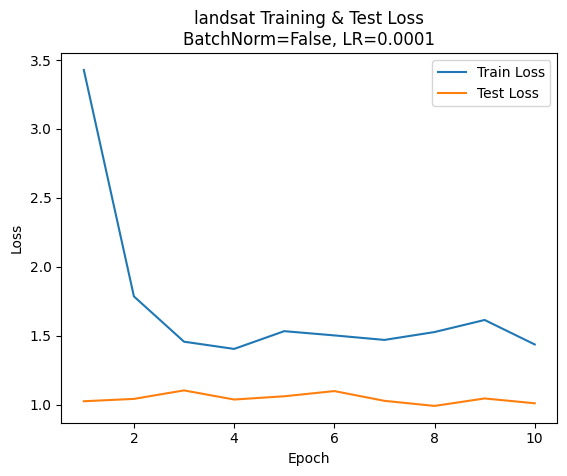

[INFO] Best params for landsat: {'batch_norm': True, 'lr': 0.001, 'epochs': 10} with RMSE=0.9043
[EVAL] Avg Loss: 2.2311 RMSE: 1.4992
[FINAL EVAL] Validation Loss: 2.2311, RMSE: 1.4992
[INFO] Extracted 25 embeddings with spatial info for validation.

===== Processing EO product: landsat_idx =====
[INFO] TRAIN dataset for landsat_idx initialized with 104 tiles.
[INFO] TEST dataset for landsat_idx initialized with 22 tiles.
[INFO] VAL dataset for landsat_idx initialized with 25 tiles.
[INFO] Starting hyperparameter search for landsat_idx

[GRID SEARCH] batch_norm=True, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 7 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 1.3438
[TRAIN] Batch 10 Loss: 1.4577
[TRAIN] Epoch Avg Loss: 1.8038
[EVAL] Avg Loss: 1.0925 RMSE: 1.0280
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.6027
[TRAIN] Batch 10 Loss: 1.3394
[TRAIN] Epoch Avg Loss: 1.6214
[EVAL] Avg Loss: 0.9904 RMSE: 0.9750
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 0.9643
[TRAIN] Batch 10

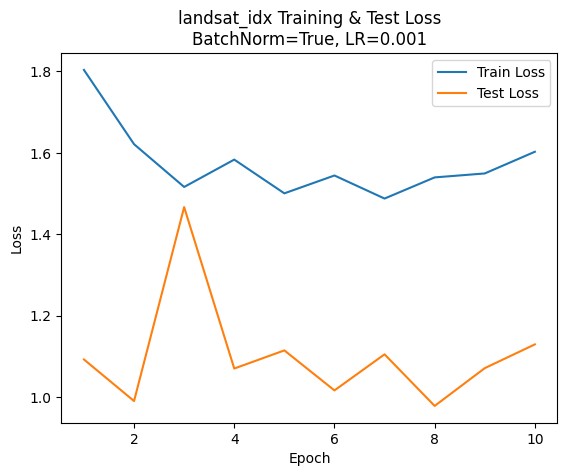


[GRID SEARCH] batch_norm=True, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 7 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 6.1706
[TRAIN] Batch 10 Loss: 1.6242
[TRAIN] Epoch Avg Loss: 2.7132
[EVAL] Avg Loss: 1.0137 RMSE: 0.9797
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 0.9353
[TRAIN] Batch 10 Loss: 0.8641
[TRAIN] Epoch Avg Loss: 1.6728
[EVAL] Avg Loss: 0.9692 RMSE: 0.9631
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.0856
[TRAIN] Batch 10 Loss: 0.9404
[TRAIN] Epoch Avg Loss: 1.5758
[EVAL] Avg Loss: 1.1686 RMSE: 1.0664
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 0.3744
[TRAIN] Batch 10 Loss: 2.6102
[TRAIN] Epoch Avg Loss: 1.5772
[EVAL] Avg Loss: 1.0103 RMSE: 0.9850
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 2.3414
[TRAIN] Batch 10 Loss: 1.7634
[TRAIN] Epoch Avg Loss: 1.5087
[EVAL] Avg Loss: 1.0965 RMSE: 1.0282
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 2.3860
[TRAIN] Batch 10 Loss: 1.6743
[TRAIN] Epoch Avg Loss: 1.5381
[EVAL] Avg Loss: 1.1046 RMSE: 1.0349
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.41

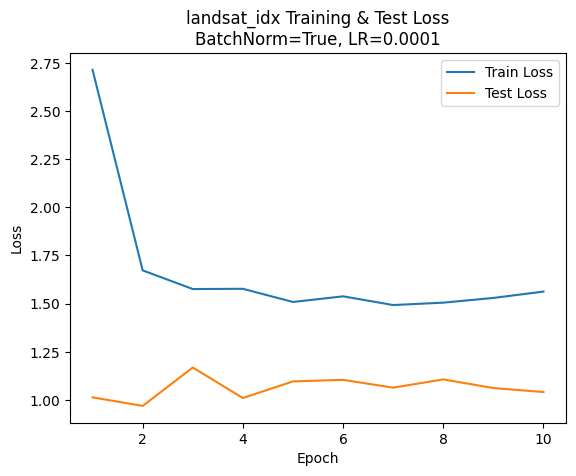


[GRID SEARCH] batch_norm=False, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 7 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 9.0186
[TRAIN] Batch 10 Loss: 0.5840
[TRAIN] Epoch Avg Loss: 2.1141
[EVAL] Avg Loss: 1.1640 RMSE: 1.0632
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.4355
[TRAIN] Batch 10 Loss: 1.8781
[TRAIN] Epoch Avg Loss: 1.5554
[EVAL] Avg Loss: 1.0062 RMSE: 0.9831
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.9433
[TRAIN] Batch 10 Loss: 0.8940
[TRAIN] Epoch Avg Loss: 1.7284
[EVAL] Avg Loss: 0.9837 RMSE: 0.9709
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 0.9162
[TRAIN] Batch 10 Loss: 2.6499
[TRAIN] Epoch Avg Loss: 1.6858
[EVAL] Avg Loss: 1.0536 RMSE: 1.0081
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 2.1008
[TRAIN] Batch 10 Loss: 1.3636
[TRAIN] Epoch Avg Loss: 1.5387
[EVAL] Avg Loss: 1.2250 RMSE: 1.0922
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.0888
[TRAIN] Batch 10 Loss: 1.9348
[TRAIN] Epoch Avg Loss: 1.4986
[EVAL] Avg Loss: 0.9757 RMSE: 0.9665
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.6

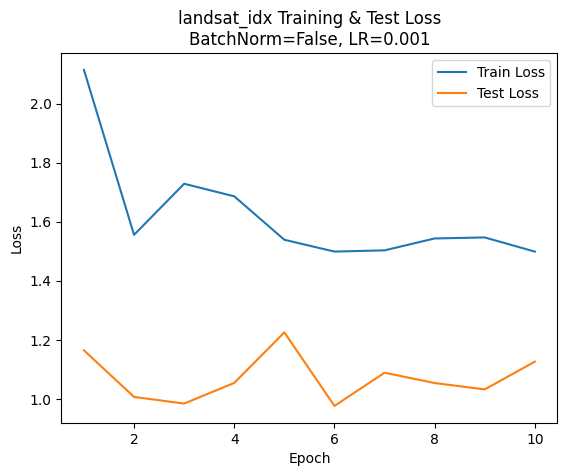


[GRID SEARCH] batch_norm=False, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 7 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 4.9163
[TRAIN] Batch 10 Loss: 0.7763
[TRAIN] Epoch Avg Loss: 2.2363
[EVAL] Avg Loss: 0.9546 RMSE: 0.9515
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.1958
[TRAIN] Batch 10 Loss: 1.6828
[TRAIN] Epoch Avg Loss: 1.5280
[EVAL] Avg Loss: 1.2960 RMSE: 1.1249
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.6215
[TRAIN] Batch 10 Loss: 2.9496
[TRAIN] Epoch Avg Loss: 1.5814
[EVAL] Avg Loss: 1.1252 RMSE: 1.0441
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.1050
[TRAIN] Batch 10 Loss: 2.0884
[TRAIN] Epoch Avg Loss: 1.5075
[EVAL] Avg Loss: 1.0618 RMSE: 1.0122
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 2.2321
[TRAIN] Batch 10 Loss: 1.9856
[TRAIN] Epoch Avg Loss: 1.5440
[EVAL] Avg Loss: 1.0365 RMSE: 0.9991
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.9484
[TRAIN] Batch 10 Loss: 0.7153
[TRAIN] Epoch Avg Loss: 1.5055
[EVAL] Avg Loss: 1.0376 RMSE: 0.9997
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 2.

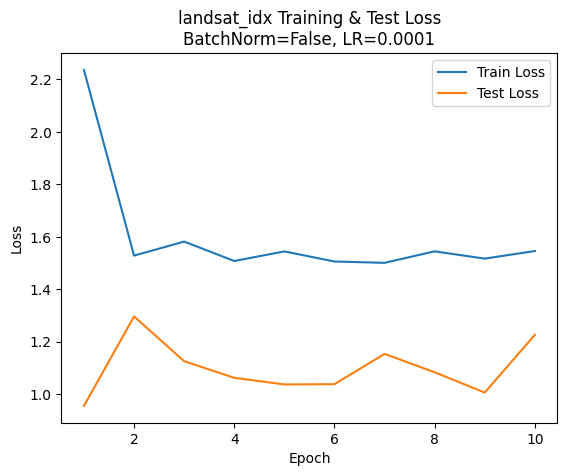

[INFO] Best params for landsat_idx: {'batch_norm': True, 'lr': 0.0001, 'epochs': 10} with RMSE=1.0017
[EVAL] Avg Loss: 2.1612 RMSE: 1.5211
[FINAL EVAL] Validation Loss: 2.1612, RMSE: 1.5211
[INFO] Extracted 25 embeddings with spatial info for validation.

===== Processing EO product: hls =====
[INFO] TRAIN dataset for hls initialized with 105 tiles.
[INFO] TEST dataset for hls initialized with 22 tiles.
[INFO] VAL dataset for hls initialized with 25 tiles.
[INFO] Starting hyperparameter search for hls

[GRID SEARCH] batch_norm=True, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 7 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.6705
[TRAIN] Batch 10 Loss: 2.5259
[TRAIN] Epoch Avg Loss: 2.1620
[EVAL] Avg Loss: 0.9738 RMSE: 0.9652
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 3.0333
[TRAIN] Batch 10 Loss: 1.6713
[TRAIN] Epoch Avg Loss: 1.4705
[EVAL] Avg Loss: 0.9912 RMSE: 0.9747
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.3304
[TRAIN] Batch 10 Loss: 1.3585
[TRAIN] Epoch Avg Los

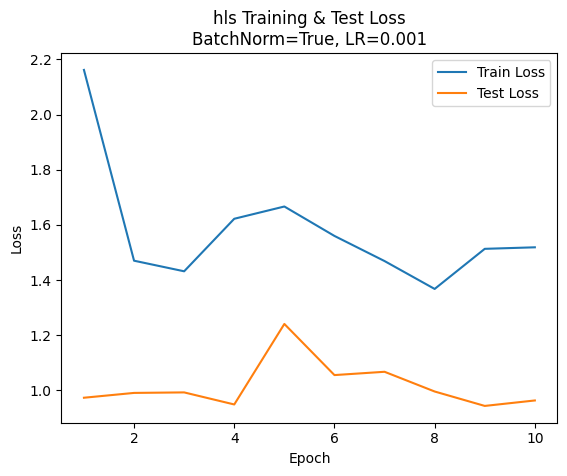


[GRID SEARCH] batch_norm=True, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 7 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 10.7759
[TRAIN] Batch 10 Loss: 2.4073
[TRAIN] Epoch Avg Loss: 3.2232
[EVAL] Avg Loss: 0.9635 RMSE: 0.9557
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 0.9594
[TRAIN] Batch 10 Loss: 2.0723
[TRAIN] Epoch Avg Loss: 1.5364
[EVAL] Avg Loss: 0.9656 RMSE: 0.9607
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 0.5135
[TRAIN] Batch 10 Loss: 1.1111
[TRAIN] Epoch Avg Loss: 1.5603
[EVAL] Avg Loss: 1.0876 RMSE: 1.0250
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 2.8492
[TRAIN] Batch 10 Loss: 1.2993
[TRAIN] Epoch Avg Loss: 1.4278
[EVAL] Avg Loss: 0.9916 RMSE: 0.9745
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 2.6187
[TRAIN] Batch 10 Loss: 1.2954
[TRAIN] Epoch Avg Loss: 1.4621
[EVAL] Avg Loss: 1.0262 RMSE: 0.9923
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.2539
[TRAIN] Batch 10 Loss: 0.3218
[TRAIN] Epoch Avg Loss: 1.4023
[EVAL] Avg Loss: 1.0610 RMSE: 1.0078
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.5

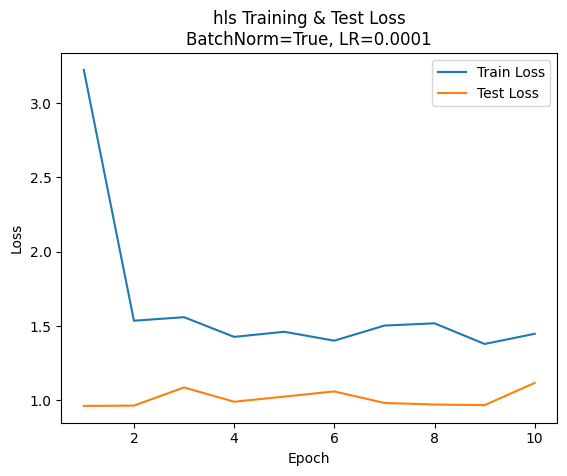


[GRID SEARCH] batch_norm=False, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 7 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.8547
[TRAIN] Batch 10 Loss: 2.0424
[TRAIN] Epoch Avg Loss: 2.1380
[EVAL] Avg Loss: 0.9471 RMSE: 0.9495
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.5263
[TRAIN] Batch 10 Loss: 3.5204
[TRAIN] Epoch Avg Loss: 1.9358
[EVAL] Avg Loss: 1.0639 RMSE: 1.0133
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.0729
[TRAIN] Batch 10 Loss: 1.5966
[TRAIN] Epoch Avg Loss: 1.4064
[EVAL] Avg Loss: 1.0398 RMSE: 1.0008
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 2.3309
[TRAIN] Batch 10 Loss: 1.3938
[TRAIN] Epoch Avg Loss: 1.4903
[EVAL] Avg Loss: 1.0119 RMSE: 0.9861
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.6101
[TRAIN] Batch 10 Loss: 0.6093
[TRAIN] Epoch Avg Loss: 1.4530
[EVAL] Avg Loss: 1.0470 RMSE: 1.0046
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.9305
[TRAIN] Batch 10 Loss: 1.4849
[TRAIN] Epoch Avg Loss: 1.5829
[EVAL] Avg Loss: 1.0098 RMSE: 0.9850
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.8

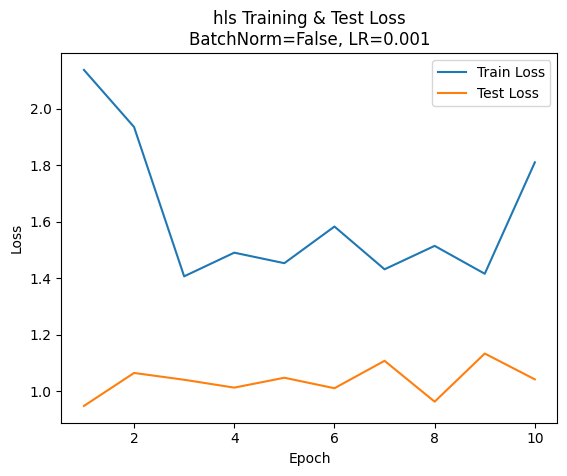


[GRID SEARCH] batch_norm=False, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 7 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 6.1976
[TRAIN] Batch 10 Loss: 1.3878
[TRAIN] Epoch Avg Loss: 1.9558
[EVAL] Avg Loss: 0.9458 RMSE: 0.9479
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.1421
[TRAIN] Batch 10 Loss: 1.1544
[TRAIN] Epoch Avg Loss: 1.5305
[EVAL] Avg Loss: 1.1547 RMSE: 1.0585
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.3052
[TRAIN] Batch 10 Loss: 2.1261
[TRAIN] Epoch Avg Loss: 1.6464
[EVAL] Avg Loss: 1.1114 RMSE: 1.0372
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.4781
[TRAIN] Batch 10 Loss: 0.3584
[TRAIN] Epoch Avg Loss: 1.8853
[EVAL] Avg Loss: 0.9853 RMSE: 0.9717
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.6991
[TRAIN] Batch 10 Loss: 2.2053
[TRAIN] Epoch Avg Loss: 1.6885
[EVAL] Avg Loss: 1.2331 RMSE: 1.0959
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.3264
[TRAIN] Batch 10 Loss: 1.9449
[TRAIN] Epoch Avg Loss: 1.6304
[EVAL] Avg Loss: 0.9580 RMSE: 0.9563
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.

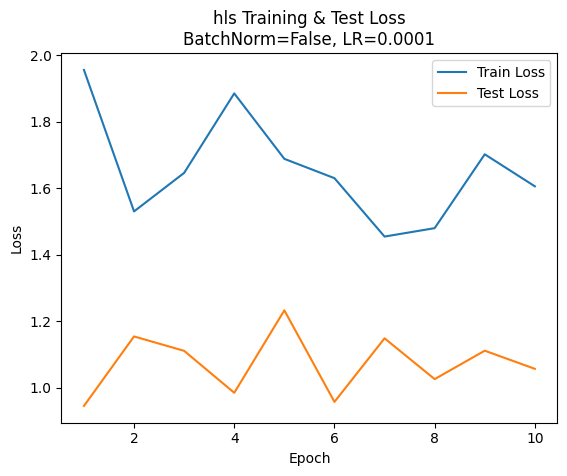

[INFO] Best params for hls: {'batch_norm': True, 'lr': 0.001, 'epochs': 10} with RMSE=0.9628
[EVAL] Avg Loss: 2.2837 RMSE: 1.4600
[FINAL EVAL] Validation Loss: 2.2837, RMSE: 1.4600
[INFO] Extracted 25 embeddings with spatial info for validation.

===== Processing EO product: tcap =====
[INFO] TRAIN dataset for tcap initialized with 105 tiles.
[INFO] TEST dataset for tcap initialized with 22 tiles.
[INFO] VAL dataset for tcap initialized with 25 tiles.
[INFO] Starting hyperparameter search for tcap

[GRID SEARCH] batch_norm=True, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 6.5943
[TRAIN] Batch 10 Loss: 2.5122
[TRAIN] Epoch Avg Loss: 2.3288
[EVAL] Avg Loss: 0.9421 RMSE: 0.9466
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 2.2829
[TRAIN] Batch 10 Loss: 1.2404
[TRAIN] Epoch Avg Loss: 1.6288
[EVAL] Avg Loss: 1.1510 RMSE: 1.0570
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 0.9618
[TRAIN] Batch 10 Loss: 2.0721
[TRAIN] Epoch Avg Loss: 1

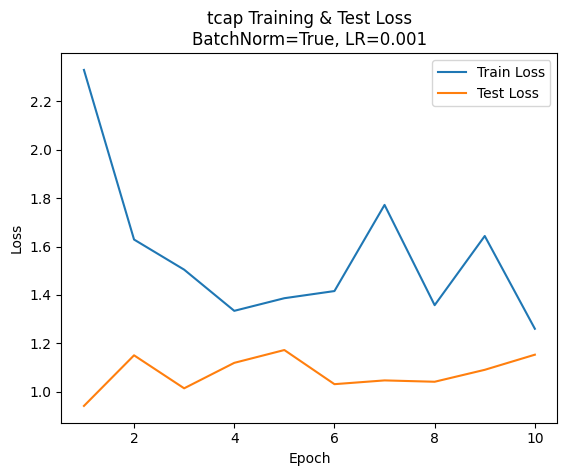


[GRID SEARCH] batch_norm=True, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 11.2775
[TRAIN] Batch 10 Loss: 1.8440
[TRAIN] Epoch Avg Loss: 3.5318
[EVAL] Avg Loss: 0.9391 RMSE: 0.9448
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.4313
[TRAIN] Batch 10 Loss: 1.2600
[TRAIN] Epoch Avg Loss: 1.5241
[EVAL] Avg Loss: 0.9258 RMSE: 0.9390
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.0930
[TRAIN] Batch 10 Loss: 1.1894
[TRAIN] Epoch Avg Loss: 1.2394
[EVAL] Avg Loss: 0.8922 RMSE: 0.9279
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.3724
[TRAIN] Batch 10 Loss: 0.4173
[TRAIN] Epoch Avg Loss: 1.3790
[EVAL] Avg Loss: 0.8982 RMSE: 0.9328
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 2.0889
[TRAIN] Batch 10 Loss: 1.1346
[TRAIN] Epoch Avg Loss: 1.3950
[EVAL] Avg Loss: 0.9094 RMSE: 0.9460
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 0.9265
[TRAIN] Batch 10 Loss: 1.0373
[TRAIN] Epoch Avg Loss: 1.5123
[EVAL] Avg Loss: 0.8795 RMSE: 0.9371
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.7

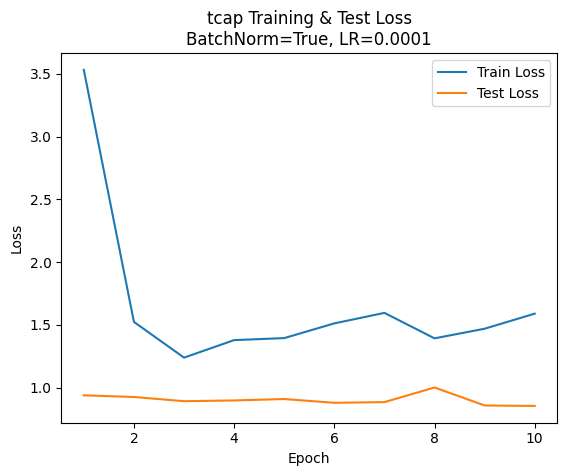


[GRID SEARCH] batch_norm=False, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.1748
[TRAIN] Batch 10 Loss: 1.6213
[TRAIN] Epoch Avg Loss: 2.1633
[EVAL] Avg Loss: 0.9462 RMSE: 0.9484
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 2.3838
[TRAIN] Batch 10 Loss: 0.4934
[TRAIN] Epoch Avg Loss: 1.5723
[EVAL] Avg Loss: 1.1245 RMSE: 1.0438
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.8970
[TRAIN] Batch 10 Loss: 1.8752
[TRAIN] Epoch Avg Loss: 1.5082
[EVAL] Avg Loss: 0.9871 RMSE: 0.9727
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.0823
[TRAIN] Batch 10 Loss: 1.6703
[TRAIN] Epoch Avg Loss: 1.8484
[EVAL] Avg Loss: 1.1097 RMSE: 1.0365
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.6726
[TRAIN] Batch 10 Loss: 2.4387
[TRAIN] Epoch Avg Loss: 1.6070
[EVAL] Avg Loss: 0.9773 RMSE: 0.9673
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 2.2334
[TRAIN] Batch 10 Loss: 1.4702
[TRAIN] Epoch Avg Loss: 1.5285
[EVAL] Avg Loss: 1.1373 RMSE: 1.0501
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.4

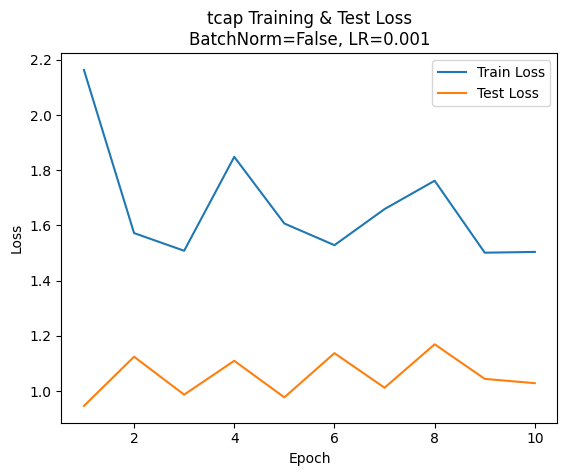


[GRID SEARCH] batch_norm=False, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 6 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 5.8032
[TRAIN] Batch 10 Loss: 0.8852
[TRAIN] Epoch Avg Loss: 2.1851
[EVAL] Avg Loss: 0.9453 RMSE: 0.9479
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.4240
[TRAIN] Batch 10 Loss: 1.7369
[TRAIN] Epoch Avg Loss: 1.5162
[EVAL] Avg Loss: 1.0585 RMSE: 1.0107
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.4978
[TRAIN] Batch 10 Loss: 1.7681
[TRAIN] Epoch Avg Loss: 1.4102
[EVAL] Avg Loss: 1.0686 RMSE: 1.0159
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 3.2235
[TRAIN] Batch 10 Loss: 1.7219
[TRAIN] Epoch Avg Loss: 1.4326
[EVAL] Avg Loss: 1.0333 RMSE: 0.9976
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 2.7737
[TRAIN] Batch 10 Loss: 0.6518
[TRAIN] Epoch Avg Loss: 1.7978
[EVAL] Avg Loss: 1.0761 RMSE: 1.0197
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.6221
[TRAIN] Batch 10 Loss: 3.0956
[TRAIN] Epoch Avg Loss: 1.5657
[EVAL] Avg Loss: 1.1934 RMSE: 1.0774
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.

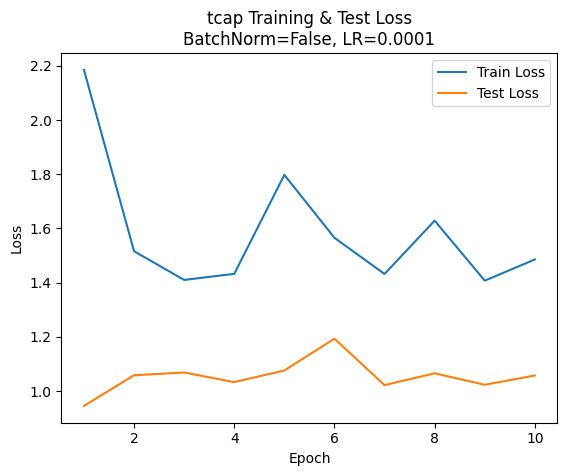

[INFO] Best params for tcap: {'batch_norm': True, 'lr': 0.0001, 'epochs': 10} with RMSE=0.9255
[EVAL] Avg Loss: 1.8417 RMSE: 1.4222
[FINAL EVAL] Validation Loss: 1.8417, RMSE: 1.4222
[INFO] Extracted 25 embeddings with spatial info for validation.

===== Processing EO product: dem =====
[INFO] TRAIN dataset for dem initialized with 112 tiles.
[INFO] TEST dataset for dem initialized with 24 tiles.
[INFO] VAL dataset for dem initialized with 26 tiles.
[INFO] Starting hyperparameter search for dem

[GRID SEARCH] batch_norm=True, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 2 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 3.6014
[TRAIN] Batch 10 Loss: 1.7908
[TRAIN] Epoch Avg Loss: 1.7392
[EVAL] Avg Loss: 1.1161 RMSE: 1.0564
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.1356
[TRAIN] Batch 10 Loss: 0.7967
[TRAIN] Epoch Avg Loss: 1.3824
[EVAL] Avg Loss: 1.3837 RMSE: 1.1763
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 0.9149
[TRAIN] Batch 10 Loss: 1.6728
[TRAIN] Epoch Avg Loss: 1.34

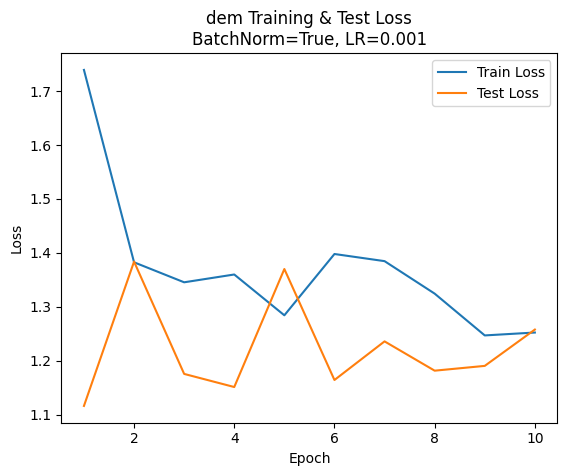


[GRID SEARCH] batch_norm=True, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 2 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 10.0565
[TRAIN] Batch 10 Loss: 1.5820
[TRAIN] Epoch Avg Loss: 2.8166
[EVAL] Avg Loss: 1.1779 RMSE: 1.0853
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.5075
[TRAIN] Batch 10 Loss: 1.3829
[TRAIN] Epoch Avg Loss: 1.4174
[EVAL] Avg Loss: 1.2221 RMSE: 1.1055
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.7787
[TRAIN] Batch 10 Loss: 2.3973
[TRAIN] Epoch Avg Loss: 1.2739
[EVAL] Avg Loss: 1.1727 RMSE: 1.0829
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.8256
[TRAIN] Batch 10 Loss: 2.3551
[TRAIN] Epoch Avg Loss: 1.3352
[EVAL] Avg Loss: 1.2405 RMSE: 1.1138
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.3622
[TRAIN] Batch 10 Loss: 0.9557
[TRAIN] Epoch Avg Loss: 1.3144
[EVAL] Avg Loss: 1.1658 RMSE: 1.0797
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.8711
[TRAIN] Batch 10 Loss: 1.5268
[TRAIN] Epoch Avg Loss: 1.2776
[EVAL] Avg Loss: 1.2089 RMSE: 1.0995
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.6

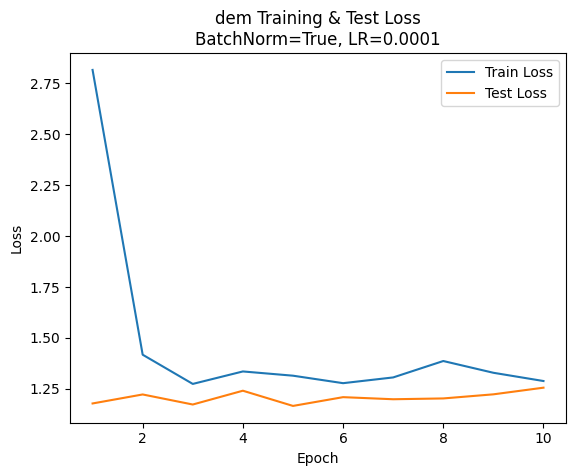


[GRID SEARCH] batch_norm=False, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 2 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 14.3118
[TRAIN] Batch 10 Loss: 1.4510
[TRAIN] Epoch Avg Loss: 2.3152
[EVAL] Avg Loss: 1.1733 RMSE: 1.0832
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.6972
[TRAIN] Batch 10 Loss: 1.7877
[TRAIN] Epoch Avg Loss: 1.5185
[EVAL] Avg Loss: 1.3812 RMSE: 1.1753
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.7018
[TRAIN] Batch 10 Loss: 1.6623
[TRAIN] Epoch Avg Loss: 1.4170
[EVAL] Avg Loss: 1.3078 RMSE: 1.1436
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.8231
[TRAIN] Batch 10 Loss: 2.6504
[TRAIN] Epoch Avg Loss: 1.3435
[EVAL] Avg Loss: 1.2394 RMSE: 1.1133
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.1845
[TRAIN] Batch 10 Loss: 1.0569
[TRAIN] Epoch Avg Loss: 1.3545
[EVAL] Avg Loss: 1.2983 RMSE: 1.1394
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.0403
[TRAIN] Batch 10 Loss: 1.2495
[TRAIN] Epoch Avg Loss: 1.3740
[EVAL] Avg Loss: 1.1889 RMSE: 1.0904
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 2.

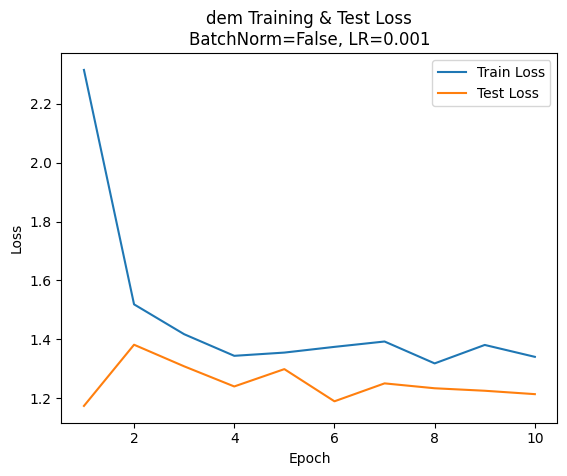


[GRID SEARCH] batch_norm=False, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 2 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 7.6978
[TRAIN] Batch 10 Loss: 1.8724
[TRAIN] Epoch Avg Loss: 2.4301
[EVAL] Avg Loss: 1.2293 RMSE: 1.1088
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 3.5551
[TRAIN] Batch 10 Loss: 1.2522
[TRAIN] Epoch Avg Loss: 1.4040
[EVAL] Avg Loss: 1.3586 RMSE: 1.1656
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.1761
[TRAIN] Batch 10 Loss: 1.4177
[TRAIN] Epoch Avg Loss: 1.4170
[EVAL] Avg Loss: 1.2266 RMSE: 1.1075
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 0.9046
[TRAIN] Batch 10 Loss: 1.9552
[TRAIN] Epoch Avg Loss: 1.3541
[EVAL] Avg Loss: 1.3111 RMSE: 1.1450
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.1374
[TRAIN] Batch 10 Loss: 1.5370
[TRAIN] Epoch Avg Loss: 1.3587
[EVAL] Avg Loss: 1.2430 RMSE: 1.1149
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.6356
[TRAIN] Batch 10 Loss: 1.3262
[TRAIN] Epoch Avg Loss: 1.3972
[EVAL] Avg Loss: 1.2812 RMSE: 1.1319
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.

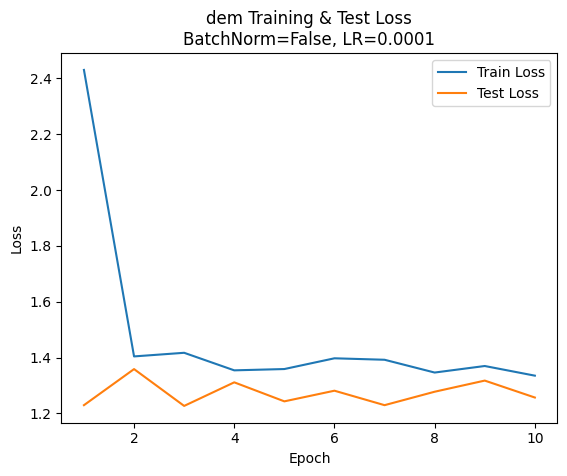

[INFO] Best params for dem: {'batch_norm': False, 'lr': 0.001, 'epochs': 10} with RMSE=1.1015
[EVAL] Avg Loss: 2.2206 RMSE: 1.5298
[FINAL EVAL] Validation Loss: 2.2206, RMSE: 1.5298
[INFO] Extracted 26 embeddings with spatial info for validation.

===== Processing EO product: s2_idx =====
[INFO] TRAIN dataset for s2_idx initialized with 106 tiles.
[INFO] TEST dataset for s2_idx initialized with 22 tiles.
[INFO] VAL dataset for s2_idx initialized with 26 tiles.
[INFO] Starting hyperparameter search for s2_idx

[GRID SEARCH] batch_norm=True, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 8 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 9.2961
[TRAIN] Batch 10 Loss: 0.6009
[TRAIN] Epoch Avg Loss: 2.0539
[EVAL] Avg Loss: 1.2262 RMSE: 1.0969
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.8233
[TRAIN] Batch 10 Loss: 0.8420
[TRAIN] Epoch Avg Loss: 1.6523
[EVAL] Avg Loss: 1.3375 RMSE: 1.1482
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.8581
[TRAIN] Batch 10 Loss: 3.0778
[TRAIN] Epoch 

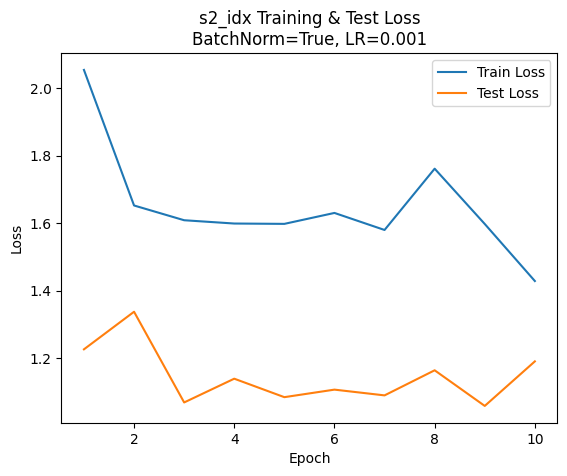


[GRID SEARCH] batch_norm=True, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=True for 8 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 12.8958
[TRAIN] Batch 10 Loss: 0.4781
[TRAIN] Epoch Avg Loss: 3.7256
[EVAL] Avg Loss: 1.3721 RMSE: 1.1490
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 3.3566
[TRAIN] Batch 10 Loss: 2.2065
[TRAIN] Epoch Avg Loss: 1.9162
[EVAL] Avg Loss: 1.1033 RMSE: 1.0361
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 1.0754
[TRAIN] Batch 10 Loss: 0.7445
[TRAIN] Epoch Avg Loss: 1.6957
[EVAL] Avg Loss: 1.2528 RMSE: 1.1100
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.5910
[TRAIN] Batch 10 Loss: 0.7893
[TRAIN] Epoch Avg Loss: 1.4906
[EVAL] Avg Loss: 1.0988 RMSE: 1.0356
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.1768
[TRAIN] Batch 10 Loss: 2.8181
[TRAIN] Epoch Avg Loss: 1.5679
[EVAL] Avg Loss: 1.0846 RMSE: 1.0273
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.7104
[TRAIN] Batch 10 Loss: 1.5551
[TRAIN] Epoch Avg Loss: 1.5116
[EVAL] Avg Loss: 1.2147 RMSE: 1.0925
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.4

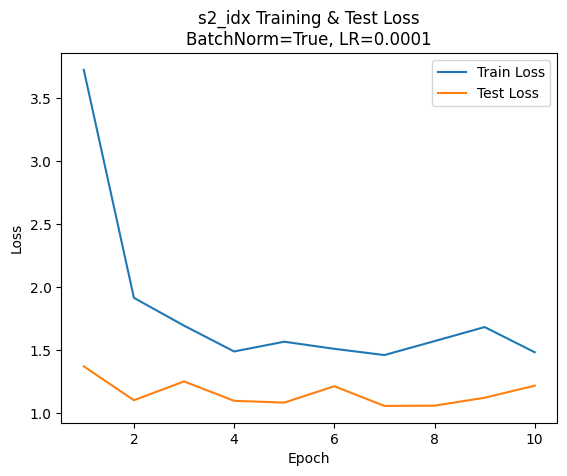


[GRID SEARCH] batch_norm=False, lr=0.001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 8 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 3.2615
[TRAIN] Batch 10 Loss: 1.7353
[TRAIN] Epoch Avg Loss: 2.1673
[EVAL] Avg Loss: 1.0755 RMSE: 1.0216
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 2.0167
[TRAIN] Batch 10 Loss: 1.8448
[TRAIN] Epoch Avg Loss: 1.4404
[EVAL] Avg Loss: 1.1599 RMSE: 1.0650
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 0.7374
[TRAIN] Batch 10 Loss: 1.6654
[TRAIN] Epoch Avg Loss: 1.5197
[EVAL] Avg Loss: 1.2326 RMSE: 1.0999
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 2.1153
[TRAIN] Batch 10 Loss: 1.2915
[TRAIN] Epoch Avg Loss: 1.4855
[EVAL] Avg Loss: 1.2249 RMSE: 1.0962
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.8760
[TRAIN] Batch 10 Loss: 2.1582
[TRAIN] Epoch Avg Loss: 1.5456
[EVAL] Avg Loss: 1.0885 RMSE: 1.0287
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 2.3299
[TRAIN] Batch 10 Loss: 0.8840
[TRAIN] Epoch Avg Loss: 1.6529
[EVAL] Avg Loss: 1.1634 RMSE: 1.0667
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.5

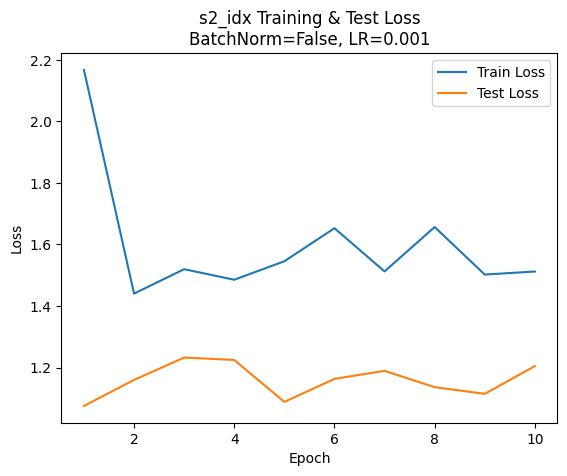


[GRID SEARCH] batch_norm=False, lr=0.0001, epochs=10
[INFO] Initialized EOViT with batch_norm=False for 8 input channels.
[EPOCH 1/10]
[TRAIN] Batch 0 Loss: 8.3210
[TRAIN] Batch 10 Loss: 1.1550
[TRAIN] Epoch Avg Loss: 2.3835
[EVAL] Avg Loss: 1.1123 RMSE: 1.0348
[EPOCH 2/10]
[TRAIN] Batch 0 Loss: 1.7720
[TRAIN] Batch 10 Loss: 2.0088
[TRAIN] Epoch Avg Loss: 1.5243
[EVAL] Avg Loss: 1.2786 RMSE: 1.1213
[EPOCH 3/10]
[TRAIN] Batch 0 Loss: 2.0350
[TRAIN] Batch 10 Loss: 2.2721
[TRAIN] Epoch Avg Loss: 1.4841
[EVAL] Avg Loss: 1.1916 RMSE: 1.0804
[EPOCH 4/10]
[TRAIN] Batch 0 Loss: 1.0689
[TRAIN] Batch 10 Loss: 1.0542
[TRAIN] Epoch Avg Loss: 1.5277
[EVAL] Avg Loss: 1.1629 RMSE: 1.0664
[EPOCH 5/10]
[TRAIN] Batch 0 Loss: 1.3455
[TRAIN] Batch 10 Loss: 3.1902
[TRAIN] Epoch Avg Loss: 1.4529
[EVAL] Avg Loss: 1.1685 RMSE: 1.0692
[EPOCH 6/10]
[TRAIN] Batch 0 Loss: 1.9828
[TRAIN] Batch 10 Loss: 1.8887
[TRAIN] Epoch Avg Loss: 1.4384
[EVAL] Avg Loss: 1.1043 RMSE: 1.0371
[EPOCH 7/10]
[TRAIN] Batch 0 Loss: 1.

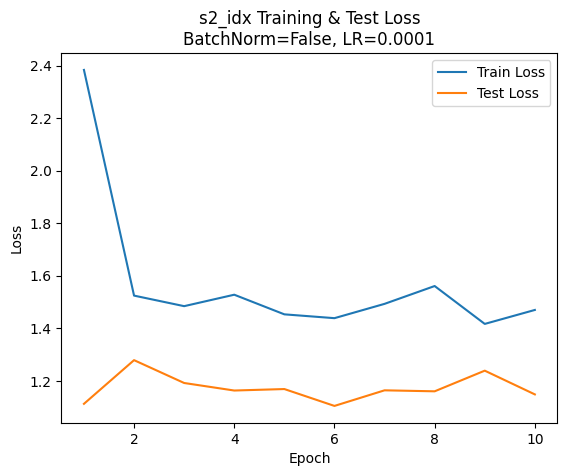

[INFO] Best params for s2_idx: {'batch_norm': False, 'lr': 0.0001, 'epochs': 10} with RMSE=1.0592
[EVAL] Avg Loss: 2.2889 RMSE: 1.5377
[FINAL EVAL] Validation Loss: 2.2889, RMSE: 1.5377
[INFO] Extracted 26 embeddings with spatial info for validation.
[INFO] Completed training and embedding extraction for all EO products.


In [78]:
### this block works saving it as is to test the features above

# import os
# import random
# import numpy as np
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# from torch.utils.data import Dataset, DataLoader, random_split
# import rasterio
# import matplotlib.pyplot as plt
# from sklearn.metrics import mean_squared_error
# from sklearn.manifold import TSNE

# # --- EO config ---
# eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']
# bands_per_cov = {
#     's1': 4, 's2': 6, 's2_idx': 8,
#     'landsat': 6, 'landsat_idx': 7, 'hls': 7,
#     'tcap': 6, 'dem': 2
# }

# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # --- Augmentation Transform (on-the-fly for train only) ---
# class RandomFlipRotateShift:
#     def __init__(self, max_shift=3):
#         self.max_shift = max_shift

#     def __call__(self, img_tensor):
#         # img_tensor shape: (C, H, W)
#         if random.random() > 0.5:
#             img_tensor = torch.flip(img_tensor, dims=[2])
#         if random.random() > 0.5:
#             img_tensor = torch.flip(img_tensor, dims=[1])
#         k = random.randint(0, 3)
#         img_tensor = torch.rot90(img_tensor, k, dims=[1, 2])

#         shift_x = random.randint(-self.max_shift, self.max_shift)
#         shift_y = random.randint(-self.max_shift, self.max_shift)
#         img_tensor = F.pad(img_tensor, (self.max_shift, self.max_shift, self.max_shift, self.max_shift), mode='reflect')
#         h, w = img_tensor.shape[1], img_tensor.shape[2]
#         start_x = self.max_shift + shift_x
#         start_y = self.max_shift + shift_y
#         img_tensor = img_tensor[:, start_y:start_y+(h - 2*self.max_shift), start_x:start_x+(w - 2*self.max_shift)]

#         return img_tensor


# # --- Dataset ---
# class EODataset(Dataset):
#     def __init__(self, eo_name, data_dir, split, target_df, patch_size=32, transform=None):
#         self.eo_name = eo_name
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df
#         self.transform = transform

#         all_files = sorted([f for f in os.listdir(data_dir)
#                             if f.startswith(f"{eo_name}_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split.upper()} dataset for {eo_name} initialized with {len(self.files)} tiles.")

#     def __len__(self):
#         return len(self.files)

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)

#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#             bounds = src.bounds
#             x_center = (bounds.left + bounds.right) / 2
#             y_center = (bounds.top + bounds.bottom) / 2

#         img_tensor = torch.from_numpy(array_resized).float()

#         if self.transform is not None and self.split == 'train':
#             img_tensor = self.transform(img_tensor)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)
#         spatial_tensor = torch.tensor([x_center, y_center], dtype=torch.float32)

#         return img_tensor, target_tensor, spatial_tensor


# # --- Vision Transformer Model ---
# class EOViT(nn.Module):
#     def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32, batch_norm=True):
#         super().__init__()
#         self.batch_norm = batch_norm
#         self.input_scaler = nn.Conv2d(in_channels, in_channels, kernel_size=1, stride=1, padding=0, bias=True)
#         self.input_norm = nn.BatchNorm2d(in_channels) if batch_norm else nn.Identity()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)

#         num_patches = (patch_dim // patch_size) ** 2
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))

#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#         print(f"[INFO] Initialized EOViT with batch_norm={batch_norm} for {in_channels} input channels.")

#     def forward(self, x):
#         x = self.input_scaler(x)
#         x = self.input_norm(x)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)

#         cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed

#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         x = self.input_scaler(x)
#         x = self.input_norm(x)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]


# # --- Training / Evaluation Loop ---
# def train_one_epoch(model, dataloader, optimizer, criterion, device):
#     model.train()
#     running_loss = 0.0
#     for batch_idx, (x, y, _) in enumerate(dataloader):
#         x, y = x.to(device), y.to(device)
#         optimizer.zero_grad()
#         outputs = model(x)
#         loss = criterion(outputs, y)
#         loss.backward()
#         optimizer.step()

#         running_loss += loss.item()
#         if batch_idx % 10 == 0:
#             print(f"[TRAIN] Batch {batch_idx} Loss: {loss.item():.4f}")

#     avg_loss = running_loss / len(dataloader)
#     print(f"[TRAIN] Epoch Avg Loss: {avg_loss:.4f}")
#     return avg_loss


# def evaluate(model, dataloader, criterion, device):
#     model.eval()
#     running_loss = 0.0
#     preds, trues = [], []
#     with torch.no_grad():
#         for x, y, _ in dataloader:
#             x, y = x.to(device), y.to(device)
#             outputs = model(x)
#             loss = criterion(outputs, y)
#             running_loss += loss.item()
#             preds.append(outputs.cpu().numpy())
#             trues.append(y.cpu().numpy())
#     avg_loss = running_loss / len(dataloader)
#     preds = np.concatenate(preds)
#     trues = np.concatenate(trues)
#     rmse = np.sqrt(mean_squared_error(trues, preds))
#     print(f"[EVAL] Avg Loss: {avg_loss:.4f} RMSE: {rmse:.4f}")
#     return avg_loss, rmse


# # --- Hyperparameter grid search ---
# def hyperparameter_search(eo, train_dataset, test_dataset, batch_size=8, epochs=10, device='cpu'):
#     print(f"[INFO] Starting hyperparameter search for {eo}")
#     # Simple grid search for batch_norm, learning rate, epochs
#     best_rmse = float('inf')
#     best_params = None
#     best_model = None

#     batch_norm_options = [True, False]
#     lr_options = [1e-3, 1e-4]
#     epoch_options = [10]  # You can extend this

#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     test_loader = DataLoader(test_dataset, batch_size=batch_size)

#     for batch_norm in batch_norm_options:
#         for lr in lr_options:
#             for n_epochs in epoch_options:
#                 print(f"\n[GRID SEARCH] batch_norm={batch_norm}, lr={lr}, epochs={n_epochs}")

#                 model = EOViT(
#                     in_channels=bands_per_cov[eo],
#                     patch_size=16,
#                     emb_dim=64,
#                     num_heads=4,
#                     num_layers=2,
#                     patch_dim=train_dataset.patch_size,
#                     batch_norm=batch_norm
#                 ).to(device)

#                 optimizer = torch.optim.Adam(model.parameters(), lr=lr)
#                 criterion = nn.MSELoss()

#                 train_losses = []
#                 test_losses = []
#                 for epoch in range(n_epochs):
#                     print(f"[EPOCH {epoch+1}/{n_epochs}]")
#                     train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
#                     test_loss, test_rmse = evaluate(model, test_loader, criterion, device)
#                     train_losses.append(train_loss)
#                     test_losses.append(test_loss)

#                 # Plot losses
#                 plt.figure()
#                 plt.plot(range(1, n_epochs+1), train_losses, label='Train Loss')
#                 plt.plot(range(1, n_epochs+1), test_losses, label='Test Loss')
#                 plt.title(f'{eo} Training & Test Loss\nBatchNorm={batch_norm}, LR={lr}')
#                 plt.xlabel('Epoch')
#                 plt.ylabel('Loss')
#                 plt.legend()
#                 plt.show()

#                 if test_rmse < best_rmse:
#                     best_rmse = test_rmse
#                     best_params = {'batch_norm': batch_norm, 'lr': lr, 'epochs': n_epochs}
#                     best_model = model

#     print(f"[INFO] Best params for {eo}: {best_params} with RMSE={best_rmse:.4f}")
#     return best_model, best_params


# # --- Extract embeddings and spatial info for val set ---
# def extract_embeddings_and_spatial(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets, all_coords = [], [], []

#     with torch.no_grad():
#         for x, y, coord in dataloader:
#             x = x.to(device)
#             emb = model.extract_cls_embeddings(x).cpu()
#             all_embeddings.append(emb)
#             all_targets.append(y)
#             all_coords.append(coord)

#     embeddings = torch.cat(all_embeddings, dim=0).numpy()
#     targets = torch.cat(all_targets, dim=0).numpy()
#     coords = torch.cat(all_coords, dim=0).numpy()

#     print(f"[INFO] Extracted {len(embeddings)} embeddings with spatial info for validation.")
#     return embeddings, targets, coords


# # --- Main pipeline ---
# def main_pipeline(data_root_dir, avg_target_df, patch_size=32, batch_size=8):
#     embedding_dict = {}
#     augmentation_transform = RandomFlipRotateShift(max_shift=3)

#     for eo in eo_list:
#         print(f"\n===== Processing EO product: {eo} =====")

#         # Prepare dataframes filtered by EO and split
#         eo_train_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_train_')]
#         eo_val_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_val_')]
#         eo_test_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_test_')]

#         # Construct datasets
#         train_dataset = EODataset(eo, data_root_dir, 'train', eo_train_df, patch_size=patch_size, transform=augmentation_transform)
#         test_dataset = EODataset(eo, data_root_dir, 'test', eo_test_df, patch_size=patch_size, transform=None)
#         val_dataset = EODataset(eo, data_root_dir, 'val', eo_val_df, patch_size=patch_size, transform=None)

#         # Hyperparameter tuning & train best model on train/test splits
#         default_epochs = 10
#         best_model, best_params = hyperparameter_search(eo, train_dataset, test_dataset, batch_size=batch_size, epochs=default_epochs, device=device)

#         # best_model, best_params = hyperparameter_search(eo, train_dataset, test_dataset, batch_size=batch_size, epochs=best_params.get('epochs', 10), device=device)

#         # Final evaluation on validation dataset with best model
#         val_loader = DataLoader(val_dataset, batch_size=batch_size)
#         criterion = nn.MSELoss()
#         val_loss, val_rmse = evaluate(best_model, val_loader, criterion, device)
#         print(f"[FINAL EVAL] Validation Loss: {val_loss:.4f}, RMSE: {val_rmse:.4f}")

#         # Extract embeddings + spatial info on val set
#         embedding, targets, coords = extract_embeddings_and_spatial(best_model, val_loader, device)
#         embedding_dict[eo] = {
#             'model': best_model,
#             'params': best_params,
#             'val_loss': val_loss,
#             'val_rmse': val_rmse,
#             'embeddings': embedding,
#             'targets': targets,
#             'coords': coords
#         }

#     print("[INFO] Completed training and embedding extraction for all EO products.")
#     return embedding_dict


# # === USAGE EXAMPLE ===
# # Make sure avg_target_df is a DataFrame with columns ['filename', 'avg_pai']
# data_root_dir = data_dir
# embedding_dict = main_pipeline(data_root_dir, avg_target_df)



# embed with spatial info and augmention

In [ ]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE
# import torch.nn.functional as F
# import random

# # --- Configs ---
# eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']
# bands_per_cov = {
#     's1': 4, 's2': 6, 's2_idx': 8,
#     'landsat': 6, 'landsat_idx': 7, 'hls': 7,
#     'tcap': 6, 'dem': 2
# }
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # --- Augmentation Transform (On-the-fly) ---
# class RandomFlipRotateShift:
#     def __init__(self, max_shift=3):
#         self.max_shift = max_shift  # pixels max shift in x and y

#     def __call__(self, img_tensor):
#         # img_tensor shape: (C, H, W)

#         # Random horizontal flip
#         if random.random() > 0.5:
#             img_tensor = torch.flip(img_tensor, dims=[2])

#         # Random vertical flip
#         if random.random() > 0.5:
#             img_tensor = torch.flip(img_tensor, dims=[1])

#         # Random 90-degree rotation (0, 90, 180, 270)
#         k = random.randint(0, 3)
#         img_tensor = torch.rot90(img_tensor, k, dims=[1, 2])

#         # Random shift with padding & crop
#         shift_x = random.randint(-self.max_shift, self.max_shift)
#         shift_y = random.randint(-self.max_shift, self.max_shift)

#         img_tensor = F.pad(img_tensor, (self.max_shift, self.max_shift, self.max_shift, self.max_shift), mode='reflect')
#         h, w = img_tensor.shape[1], img_tensor.shape[2]
#         start_x = self.max_shift + shift_x
#         start_y = self.max_shift + shift_y

#         img_tensor = img_tensor[:, start_y:start_y+(h-2*self.max_shift), start_x:start_x+(w-2*self.max_shift)]

#         return img_tensor


# # --- Dataset Class with optional transform ---
# class EODataset(Dataset):
#     def __init__(self, eo_name, data_dir, split, target_df, patch_size=32, transform=None):
#         self.eo_name = eo_name
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df
#         self.transform = transform

#         all_files = sorted([f for f in os.listdir(data_dir)
#                             if f.startswith(f"{eo_name}_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split.upper()} {eo_name} dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)

#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#             bounds = src.bounds
#             x_center = (bounds.left + bounds.right) / 2
#             y_center = (bounds.top + bounds.bottom) / 2

#         img_tensor = torch.from_numpy(array_resized).float()

#         # Apply augmentation only if transform is provided and split is 'train'
#         if self.transform is not None and self.split == 'train':
#             img_tensor = self.transform(img_tensor)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         spatial_tensor = torch.tensor([x_center, y_center], dtype=torch.float32)

#         return img_tensor, target_tensor, spatial_tensor


# # --- Vision Transformer Model with Input Normalization ---
# class EOViT(nn.Module):
#     def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32):
#         super().__init__()

#         self.input_scaler = nn.Conv2d(in_channels, in_channels, kernel_size=1, stride=1, padding=0, bias=True)
#         self.input_norm = nn.BatchNorm2d(in_channels)

#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)

#         num_patches = (patch_dim // patch_size) ** 2
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))

#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#         print(f"[INFO] EOViT initialized with input_scaler and input_norm layers for {in_channels} input channels.")

#     def forward(self, x):
#         x = self.input_scaler(x)
#         x = self.input_norm(x)

#         if self.training and x.shape[0] > 0:
#             print(f"[DEBUG] Forward stats: min={x.min().item():.4f}, max={x.max().item():.4f}, mean={x.mean().item():.4f}")

#         x = self.patch_embed(x).flatten(2).transpose(1, 2)

#         cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed

#         x = self.transformer(x)

#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         x = self.input_scaler(x)
#         x = self.input_norm(x)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]


# # --- Extract embeddings and spatial info ---
# def extract_embeddings_and_spatial(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets, all_coords = [], [], []

#     with torch.no_grad():
#         for x, y, coord in dataloader:
#             x = x.to(device)
#             emb = model.extract_cls_embeddings(x).cpu()
#             all_embeddings.append(emb)
#             all_targets.append(y)
#             all_coords.append(coord)

#     embeddings = torch.cat(all_embeddings, dim=0).numpy()
#     targets = torch.cat(all_targets, dim=0).numpy()
#     coords = torch.cat(all_coords, dim=0).numpy()
#     print(f"[INFO] Extracted {len(embeddings)} CLS + spatial embeddings")
#     return embeddings, targets, coords


# # --- t-SNE visualization ---
# def visualize_tsne_with_spatial(embeddings, coords, targets=None, eo_name="", color_by='x'):
#     from sklearn.preprocessing import StandardScaler
#     if color_by == 'x':
#         color = coords[:, 0]
#         color_label = 'Tile X (center)'
#     elif color_by == 'y':
#         color = coords[:, 1]
#         color_label = 'Tile Y (center)'
#     else:
#         color = targets
#         color_label = 'PAI'

#     emb_plus_xy = np.hstack([embeddings, coords])
#     tsne = TSNE(n_components=2, perplexity=10, random_state=42)
#     reduced = tsne.fit_transform(emb_plus_xy)

#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=color, cmap='viridis', s=40)
#     plt.colorbar(scatter, label=color_label)
#     plt.title(f't-SNE of {eo_name} Embeddings + Spatial')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.show()


# # --- Main pipeline with augmentation on train only ---
# def main_pipeline(data_root_dir, avg_target_df, patch_size=32, batch_size=8):
#     embedding_dict = {}
#     augmentation_transform = RandomFlipRotateShift(max_shift=3)

#     for eo in eo_list:
#         print(f"\n[INFO] Processing EO product: {eo}")

#         train_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_train_')]
#         val_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_val_')]

#         # Train dataset gets augmentation transform
#         train_dataset = EODataset(eo, data_root_dir, 'train', train_df, patch_size=patch_size, transform=augmentation_transform)
#         val_dataset = EODataset(eo, data_root_dir, 'val', val_df, patch_size=patch_size, transform=None)

#         train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#         val_loader = DataLoader(val_dataset, batch_size=batch_size)

#         model = EOViT(in_channels=bands_per_cov[eo], patch_size=16, emb_dim=64, patch_dim=patch_size).to(device)

#         emb, targets, coords = extract_embeddings_and_spatial(model, val_loader, device)
#         embedding_dict[eo] = {'embeddings': emb, 'targets': targets, 'coords': coords}

#         # Uncomment to visualize
#         # visualize_tsne_with_spatial(emb, coords, targets, eo_name=eo, color_by='x')

#     return embedding_dict


# # === Usage ===
# # Make sure avg_target_df contains at least: ['filename', 'avg_pai']
# data_root_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data'
# embedding_dict = main_pipeline(data_root_dir, avg_target_df)


# embed with spatial info

In [ ]:
# Working Commented off as this does nto include augmentaiton 7/18/25

#import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE

# # --- Configs ---
# eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']
# bands_per_cov = {
#     's1': 4, 's2': 6, 's2_idx': 8,
#     'landsat': 6, 'landsat_idx': 7, 'hls': 7,
#     'tcap': 6, 'dem': 2
# }
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# # --- Dataset Class with spatial info ---
# class EODataset(Dataset):
#     def __init__(self, eo_name, data_dir, split, target_df, patch_size=32):
#         self.eo_name = eo_name
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir)
#                             if f.startswith(f"{eo_name}_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split.upper()} {eo_name} dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)

#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#             bounds = src.bounds
#             x_center = (bounds.left + bounds.right) / 2
#             y_center = (bounds.top + bounds.bottom) / 2

#         img_tensor = torch.from_numpy(array_resized).float()

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         spatial_tensor = torch.tensor([x_center, y_center], dtype=torch.float32)

#         return img_tensor, target_tensor, spatial_tensor


# # # --- Vision Transformer Model --- This block has an issue of passing raw EO value tjhat are unscaled and DEM, to Indixes impact the model skill
# # class EOViT(nn.Module):
# #     def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32):
# #         super().__init__()
# #         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
# #         num_patches = (patch_dim // patch_size) ** 2
# #         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
# #         self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))
# #         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
# #         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
# #         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

# #     def forward(self, x):
# #         B = x.size(0)
# #         x = self.patch_embed(x).flatten(2).transpose(1, 2)  # (B, N, emb_dim)
# #         cls_tokens = self.cls_token.expand(B, -1, -1)
# #         x = torch.cat((cls_tokens, x), dim=1)
# #         x = x + self.pos_embed
# #         x = self.transformer(x)
# #         return self.mlp_head(x[:, 0]).squeeze(1)

# #     def extract_cls_embeddings(self, x):
# #         B = x.size(0)
# #         x = self.patch_embed(x).flatten(2).transpose(1, 2)
# #         cls_tokens = self.cls_token.expand(B, -1, -1)
# #         x = torch.cat((cls_tokens, x), dim=1)
# #         x = x + self.pos_embed
# #         x = self.transformer(x)
# #         return x[:, 0]  # return CLS token


# #-----add a normalization per eo band channel to handle per band range discrepancies
# # --- Vision Transformer Model with Input Normalization ---
# class EOViT(nn.Module):
#     def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32):
#         super().__init__()

#         # === [NEW] Learnable input scaling layer: handles different EO band ranges ===
#         self.input_scaler = nn.Conv2d(
#             in_channels, in_channels, kernel_size=1, stride=1, padding=0, bias=True
#         )

#         # === [NEW] BatchNorm for stabilizing activations post-scaling ===
#         self.input_norm = nn.BatchNorm2d(in_channels)

#         # Patch embedding to project image into tokens
#         self.patch_embed = nn.Conv2d(
#             in_channels, emb_dim, kernel_size=patch_size, stride=patch_size
#         )

#         # Positional encoding + CLS token
#         num_patches = (patch_dim // patch_size) ** 2
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))

#         # Transformer encoder
#         encoder_layer = nn.TransformerEncoderLayer(
#             d_model=emb_dim, nhead=num_heads, batch_first=True
#         )
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

#         # Prediction head
#         self.mlp_head = nn.Sequential(
#             nn.LayerNorm(emb_dim),
#             nn.Linear(emb_dim, 1)
#         )

#         print(f"[INFO] EOViT initialized with input_scaler and input_norm layers for {in_channels} input channels.")

#     def forward(self, x):
#         # === Apply input normalization pipeline ===
#         x = self.input_scaler(x)
#         x = self.input_norm(x)

#         # === [Optional debug print — useful when training new EO sets] ===
#         if self.training and x.shape[0] > 0:
#             print(f"[DEBUG] Forward stats: min={x.min().item():.4f}, max={x.max().item():.4f}, mean={x.mean().item():.4f}")

#         # Patch embedding
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)  # (B, N, emb_dim)

#         # CLS token + positional encoding
#         cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed

#         # Transformer
#         x = self.transformer(x)

#         # Final prediction from CLS token
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         # Same processing for embedding extraction
#         x = self.input_scaler(x)
#         x = self.input_norm(x)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]



# # --- Extract CLS + spatial embeddings ---
# def extract_embeddings_and_spatial(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets, all_coords = [], [], []

#     with torch.no_grad():
#         for x, y, coord in dataloader:
#             x = x.to(device)
#             emb = model.extract_cls_embeddings(x).cpu()
#             all_embeddings.append(emb)
#             all_targets.append(y)
#             all_coords.append(coord)

#     embeddings = torch.cat(all_embeddings, dim=0).numpy()
#     targets = torch.cat(all_targets, dim=0).numpy()
#     coords = torch.cat(all_coords, dim=0).numpy()
#     print(f"[INFO] Extracted {len(embeddings)} CLS + spatial embeddings")
#     return embeddings, targets, coords


# # --- t-SNE Visualization with Spatial Color Coding ---
# def visualize_tsne_with_spatial(embeddings, coords, targets=None, eo_name="", color_by='x'):
#     from sklearn.preprocessing import StandardScaler
#     if color_by == 'x':
#         color = coords[:, 0]
#         color_label = 'Tile X (center)'
#     elif color_by == 'y':
#         color = coords[:, 1]
#         color_label = 'Tile Y (center)'
#     else:
#         color = targets
#         color_label = 'PAI'

#     emb_plus_xy = np.hstack([embeddings, coords])  # Add spatial info to embedding space
#     tsne = TSNE(n_components=2, perplexity=10, random_state=42)
#     reduced = tsne.fit_transform(emb_plus_xy)

#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=color, cmap='viridis', s=40)
#     plt.colorbar(scatter, label=color_label)
#     plt.title(f't-SNE of {eo_name} Embeddings + Spatial')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.show()


# # --- Main pipeline ---
# def main_pipeline(data_root_dir, avg_target_df, patch_size=32, batch_size=8):
#     embedding_dict = {}
#     for eo in eo_list:
#         print(f"\n[INFO] Processing EO product: {eo}")

#         train_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_train_')]
#         val_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_val_')]

#         val_dataset = EODataset(eo, data_root_dir, 'val', val_df, patch_size=patch_size)
#         val_loader = DataLoader(val_dataset, batch_size=batch_size)

#         model = EOViT(in_channels=bands_per_cov[eo], patch_size=16, emb_dim=64, patch_dim=patch_size).to(device)

#         emb, targets, coords = extract_embeddings_and_spatial(model, val_loader, device)
#         embedding_dict[eo] = {'embeddings': emb, 'targets': targets, 'coords': coords}

#         # visualize_tsne_with_spatial(emb, coords, targets, eo_name=eo, color_by='x')  # try color_by='y' or 'target'

#     return embedding_dict


# # === Usage ===
# # Make sure avg_target_df contains at least: ['filename', 'avg_pai']
# data_root_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data'
# embedding_dict = main_pipeline(data_root_dir, avg_target_df)


In [79]:
embedding_dict

{'s1': {'model': EOViT(
    (input_scaler): Conv2d(4, 4, kernel_size=(1, 1), stride=(1, 1))
    (input_norm): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (patch_embed): Conv2d(4, 64, kernel_size=(16, 16), stride=(16, 16))
    (transformer): TransformerEncoder(
      (layers): ModuleList(
        (0-1): 2 x TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
          )
          (linear1): Linear(in_features=64, out_features=2048, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048, out_features=64, bias=True)
          (norm1): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
      )
    )
  

In [80]:
import numpy as np

def clean_embedding_dict(embedding_dict):
    cleaned_dict = {}

    for key, data in embedding_dict.items():
        embeddings = data['embeddings']
        targets = data['targets']
        coords = data['coords']

        # Create mask for rows without any NaNs in the embeddings
        valid_mask = ~np.isnan(embeddings).any(axis=1)
#
        num_dropped = len(valid_mask) - np.count_nonzero(valid_mask)
        print(f"[INFO] Dropping {num_dropped} NaN rows from '{key}'")

        # Filter arrays using the valid mask
        cleaned_dict[key] = {
            'embeddings': embeddings[valid_mask],
            'targets': targets[valid_mask],
            'coords': coords[valid_mask]
        }

    return cleaned_dict
embedding_dict = clean_embedding_dict(embedding_dict)


[INFO] Dropping 0 NaN rows from 's1'
[INFO] Dropping 0 NaN rows from 's2'
[INFO] Dropping 0 NaN rows from 'landsat'
[INFO] Dropping 0 NaN rows from 'landsat_idx'
[INFO] Dropping 0 NaN rows from 'hls'
[INFO] Dropping 0 NaN rows from 'tcap'
[INFO] Dropping 0 NaN rows from 'dem'
[INFO] Dropping 0 NaN rows from 's2_idx'


In [81]:
embedding_dict

{'s1': {'embeddings': array([[-1.661098  ,  1.4183556 ,  0.29154456, ..., -1.0615858 ,
           0.9424966 , -0.35733497],
         [-1.569854  ,  1.2800673 ,  0.26352027, ..., -1.2262495 ,
           0.5974185 , -0.12518013],
         [-1.645283  ,  1.4613017 ,  0.3245669 , ..., -1.2058505 ,
           0.8944758 , -0.31321588],
         ...,
         [-1.3836899 ,  1.7454723 ,  0.20112292, ..., -1.04195   ,
           1.063132  , -0.4712204 ],
         [-1.5742095 ,  1.240757  ,  0.31647834, ..., -1.3582141 ,
           0.59666246, -0.11423285],
         [-1.5475427 ,  1.0630249 ,  0.28742275, ..., -1.3140539 ,
           0.5008158 ,  0.06449373]], dtype=float32),
  'targets': array([5.0808783 , 4.5393934 , 3.096212  , 3.0381982 , 2.782471  ,
         4.3806767 , 0.3472858 , 2.6318781 , 2.002462  , 0.5071922 ,
         2.0887268 , 3.5903184 , 1.2144097 , 2.407145  , 4.4200277 ,
         2.2239034 , 4.7247057 , 0.43416214, 0.12371969, 1.9222094 ,
         0.29163796, 3.419378  , 0.093

explore the embedding ranges

In [82]:
import numpy as np

def inspect_embedding_stats(embedding_dict):
    print(f"{'EO Product':<15} {'Mean':>10} {'Std':>10} {'Min':>10} {'Max':>10}")
    print("-" * 60)

    for eo_product, data in embedding_dict.items():
        embeddings = data['embeddings']  # shape: (N_tiles, D)

        # Compute stats over all tiles
        mean_val = np.mean(embeddings)
        std_val = np.std(embeddings)
        min_val = np.min(embeddings)
        max_val = np.max(embeddings)

        print(f"{eo_product:<15} {mean_val:>10.4f} {std_val:>10.4f} {min_val:>10.4f} {max_val:>10.4f}")

# Usage
inspect_embedding_stats(embedding_dict)


EO Product            Mean        Std        Min        Max
------------------------------------------------------------
s1                  0.0001     1.0022    -2.4470     2.3016
s2                  0.0001     1.0019    -2.7827     2.1719
landsat            -0.0017     1.0142    -1.9149     1.7858
landsat_idx        -0.0001     1.0024    -2.4050     2.5727
hls                 0.0019     1.0166    -1.9469     1.7570
tcap               -0.0000     1.0022    -2.9051     2.4999
dem                -0.0021     1.0137    -1.7540     2.1126
s2_idx              0.0000     1.0017    -1.7137     2.3979


# test to see if embeddings are semantically rich

📊 s1 | R²: -1.1164 | RMSE: 2.1521
📊 s2 | R²: -0.0872 | RMSE: 1.4768
📊 landsat | R²: -0.6005 | RMSE: 1.8901
📊 landsat_idx | R²: -0.7703 | RMSE: 1.9879
📊 hls | R²: -0.7784 | RMSE: 1.9924
📊 tcap | R²: -0.8135 | RMSE: 2.0120
📊 dem | R²: -0.4614 | RMSE: 1.5824
📊 s2_idx | R²: -0.3348 | RMSE: 1.6363


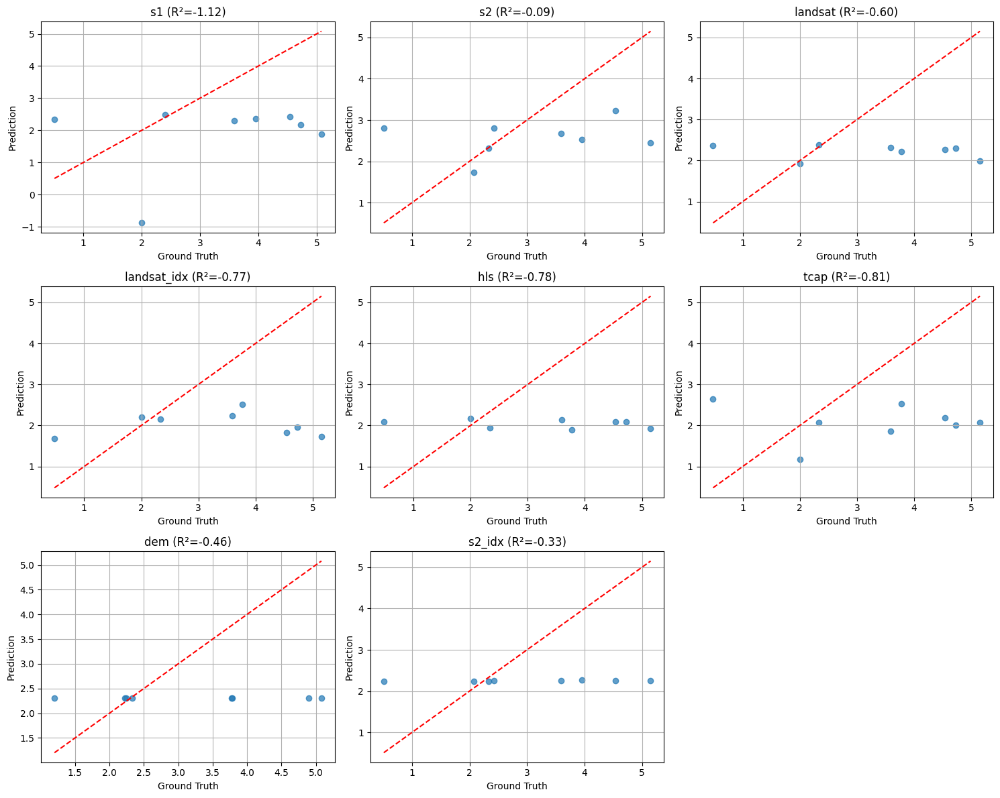

In [83]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

eo_products = list(embedding_dict.keys())

n = len(eo_products)
ncols = 3
nrows = (n + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
axes = axes.flatten()

for i, eo_product in enumerate(eo_products):
    # Extract data
    embed = embedding_dict[eo_product]['embeddings']  # (N, D)
    targets = embedding_dict[eo_product]['targets']   # (N,)

    # Split data
    X_train, X_val, y_train, y_val = train_test_split(embed, targets, test_size=0.3, random_state=42)

    # Linear probe
    model = Ridge(alpha=1.0)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)

    # Metrics
    r2 = r2_score(y_val, y_pred)
    rmse = np.sqrt(mean_squared_error(y_val, y_pred))

    print(f"📊 {eo_product} | R²: {r2:.4f} | RMSE: {rmse:.4f}")

    # Plot
    ax = axes[i]
    ax.scatter(y_val, y_pred, alpha=0.7)
    ax.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'r--')
    ax.set_xlabel("Ground Truth")
    ax.set_ylabel("Prediction")
    ax.set_title(f"{eo_product} (R²={r2:.2f})")
    ax.grid(True)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/tmp/ipython-input-84-1796461061.py:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


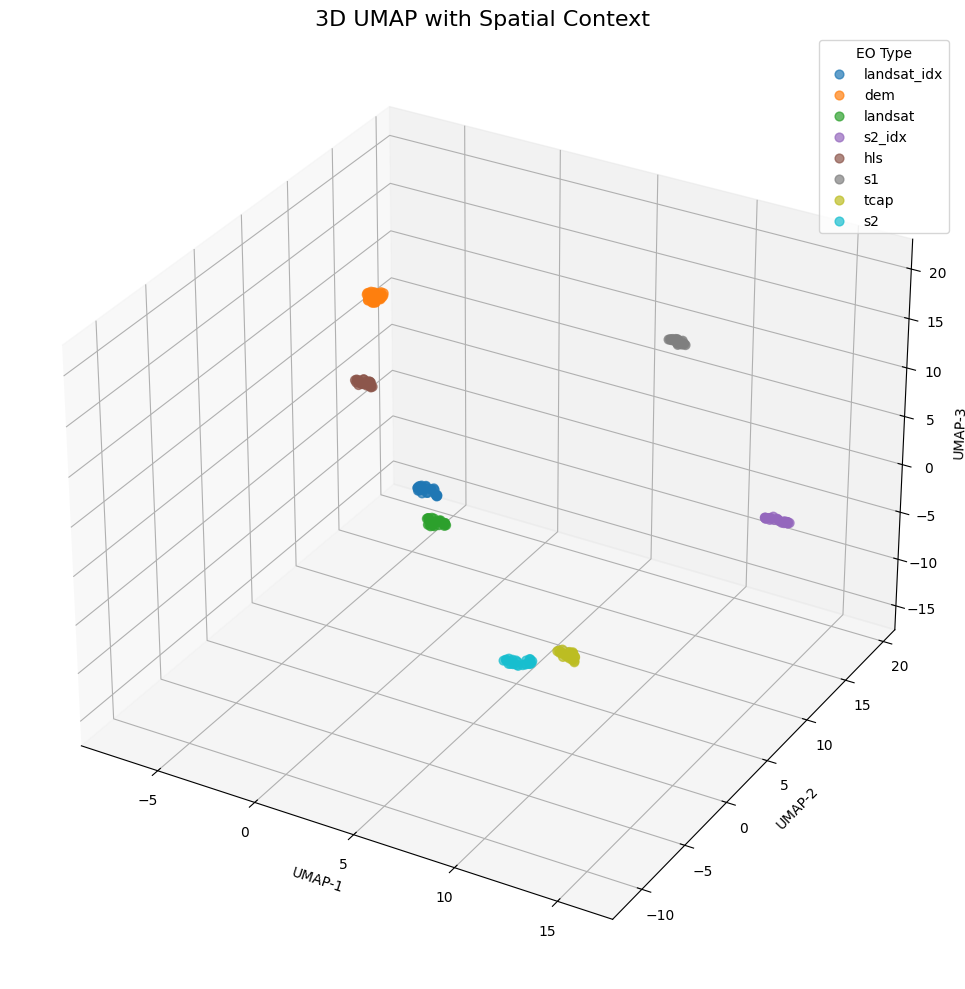

In [84]:
import numpy as np
import matplotlib.pyplot as plt
import umap
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

def visualize_umap_all_embeddings_with_spatial(
    embedding_dict,
    sample_limit=1000,
    n_components=3,
    n_neighbors=25,
    min_dist=0.1,
    alpha=100.0  # spatial weight
):
    all_embeddings = []
    all_coords = []
    all_labels = []

    for eo, data in embedding_dict.items():
        emb = data['embeddings']
        coords = data.get('coords')

        n = len(emb)
        if n == 0 or coords is None:
            continue

        limit = min(sample_limit, n)
        emb = emb[:limit]
        coords = coords[:limit]
        label = [eo] * limit

        all_embeddings.append(emb)
        all_coords.append(coords)
        all_labels.extend(label)

    # Stack data
    X_emb = np.vstack(all_embeddings)
    X_coords = np.vstack(all_coords)

    # Normalize spatial coordinates to [0, 1]
    X_coords = (X_coords - X_coords.min(axis=0)) / (X_coords.max(axis=0) - X_coords.min(axis=0))

    # Scale spatial features
    X_spatial = X_coords * alpha

    # Combine embeddings and spatial info
    X_combined = np.hstack([X_emb, X_spatial])

    # UMAP projection
    reducer = umap.UMAP(
        n_components=n_components,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric='cosine',
        random_state=42
    )
    X_umap = reducer.fit_transform(X_combined)

    # Plot
    unique_labels = list(set(all_labels))
    colors = plt.cm.get_cmap('tab10', len(unique_labels))

    if n_components == 3:
        fig = plt.figure(figsize=(14, 10))
        ax = fig.add_subplot(111, projection='3d')
        for i, eo in enumerate(unique_labels):
            idx = [j for j, label in enumerate(all_labels) if label == eo]
            ax.scatter(X_umap[idx, 0], X_umap[idx, 1], X_umap[idx, 2],
                       label=eo, s=40, alpha=0.7, color=colors(i))
        ax.set_xlabel("UMAP-1")
        ax.set_ylabel("UMAP-2")
        ax.set_zlabel("UMAP-3")
        ax.set_title("3D UMAP with Spatial Context", fontsize=16)
    else:
        plt.figure(figsize=(12, 8))
        for i, eo in enumerate(unique_labels):
            idx = [j for j, label in enumerate(all_labels) if label == eo]
            plt.scatter(X_umap[idx, 0], X_umap[idx, 1],
                        label=eo, s=40, alpha=0.7, color=colors(i))
        plt.xlabel("UMAP-1")
        plt.ylabel("UMAP-2")
        plt.title("2D UMAP with Spatial Context", fontsize=16)

    plt.legend(title="EO Type")
    plt.tight_layout()
    plt.show()

# Example use (with spatial influence)
visualize_umap_all_embeddings_with_spatial(
    embedding_dict,
    n_components=3,
    alpha=5.0  # try 1.0, 5.0, 10.0 to see the effect
)


# Fusion model

Prediction batch stats:
Min: 0.14, Max: 0.14, Mean: 0.14
[Epoch 1] Train Loss: 0.0055 | Val Loss: 0.8047
Prediction batch stats:
Min: 0.16, Max: 0.16, Mean: 0.16
[Epoch 2] Train Loss: 0.0008 | Val Loss: 0.7604
Prediction batch stats:
Min: 0.14, Max: 0.14, Mean: 0.14
[Epoch 3] Train Loss: 0.0036 | Val Loss: 0.7956
Prediction batch stats:
Min: 0.11, Max: 0.11, Mean: 0.11
[Epoch 4] Train Loss: 0.0013 | Val Loss: 0.8534
Prediction batch stats:
Min: 0.09, Max: 0.09, Mean: 0.09
[Epoch 5] Train Loss: 0.0000 | Val Loss: 0.8998
Prediction batch stats:
Min: 0.08, Max: 0.08, Mean: 0.08
[Epoch 6] Train Loss: 0.0010 | Val Loss: 0.9158
Prediction batch stats:
Min: 0.08, Max: 0.08, Mean: 0.08
[Epoch 7] Train Loss: 0.0017 | Val Loss: 0.9042
Prediction batch stats:
Min: 0.10, Max: 0.10, Mean: 0.10
[Epoch 8] Train Loss: 0.0012 | Val Loss: 0.8759
Prediction batch stats:
Min: 0.12, Max: 0.12, Mean: 0.12
[Epoch 9] Train Loss: 0.0003 | Val Loss: 0.8428
Prediction batch stats:
Min: 0.13, Max: 0.13, Mean: 0.1

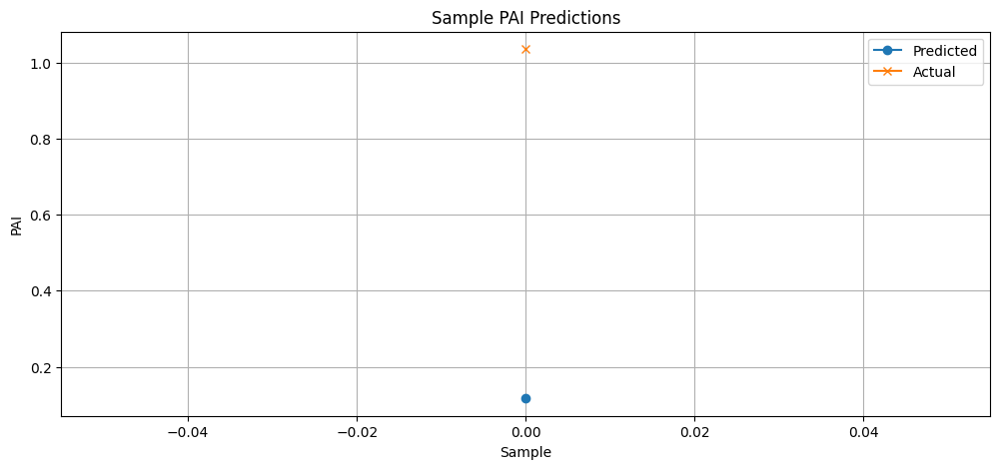

Validation sample count: 1


In [85]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import random

# --- Attention-Based Fusion Module ---
class AttentionFusion(nn.Module):
    def __init__(self, num_eos=8, emb_dim=64):
        super().__init__()
        self.query = nn.Linear(emb_dim, emb_dim)
        self.key = nn.Linear(emb_dim, emb_dim)
        self.value = nn.Linear(emb_dim, emb_dim)
        self.scale = emb_dim ** 0.5

    def forward(self, x):  # x: [B, N, D]
        Q = self.query(x)
        K = self.key(x)
        V = self.value(x)
        attn_scores = torch.matmul(Q, K.transpose(-2, -1)) / self.scale  # [B, N, N]
        attn_weights = F.softmax(attn_scores, dim=-1)
        fused = torch.matmul(attn_weights, V)  # [B, N, D]
        return fused.mean(dim=1)  # [B, D]

# --- Regression Model with Fusion ---
class PAIRegressorWithFusion(nn.Module):
    def __init__(self, num_eos=8, emb_dim=64, hidden_dim=128):
        super().__init__()
        self.fusion = AttentionFusion(num_eos, emb_dim)
        self.regressor = nn.Sequential(
            nn.Linear(emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x):  # x: [B, N, D]
        fused = self.fusion(x)  # [B, D]
        return self.regressor(fused).squeeze(1)

# --- Prepare Fusion Dataset from embedding_dict ---
# def prepare_fusion_dataset(embedding_dict, eo_list):
#     tensors = []
#     for eo in eo_list:
#         emb = torch.tensor(embedding_dict[eo]['embeddings'], dtype=torch.float32)  # [B, D]
#         tensors.append(emb.unsqueeze(1))  # [B, 1, D]
#     x = torch.cat(tensors, dim=1)  # [B, N, D]

#     # Assume targets are the same for all EO sources
#     y = torch.tensor(embedding_dict[eo_list[0]]['targets'], dtype=torch.float32)  # [B]
#     return TensorDataset(x, y)

def align_and_prepare_dataset(embedding_dict, eo_list, emb_dim=64, min_sources=6):
    from collections import defaultdict

    # Step 1: Collect tile -> list of (eo, idx) mappings
    coord_to_eo_idx = defaultdict(list)
    for eo in eo_list:
        coords = embedding_dict[eo]['coords']
        for idx, coord in enumerate(coords):
            coord_tuple = tuple(coord)
            coord_to_eo_idx[coord_tuple].append((eo, idx))

    # Step 2: Filter tiles with at least min_sources available
    filtered_tiles = {coord: entries for coord, entries in coord_to_eo_idx.items() if len(entries) >= min_sources}
    if not filtered_tiles:
        raise ValueError(f"No tiles found with at least {min_sources} sources.")

    # Step 3: Construct aligned dataset
    x_list = []
    y_list = []

    for coord, eo_indices in filtered_tiles.items():
        eo_to_idx = dict(eo_indices)

        emb_stack = []
        for eo in eo_list:
            if eo in eo_to_idx:
                idx = eo_to_idx[eo]
                emb = embedding_dict[eo]['embeddings'][idx]
                # Pad or trim to emb_dim
                if emb.shape[0] < emb_dim:
                    emb = np.pad(emb, (0, emb_dim - emb.shape[0]), mode='constant')
                elif emb.shape[0] > emb_dim:
                    emb = emb[:emb_dim]
            else:
                # Missing EO source — use zero vector
                emb = np.zeros(emb_dim, dtype=np.float32)
            emb_stack.append(torch.tensor(emb, dtype=torch.float32).unsqueeze(0))

        x = torch.cat(emb_stack, dim=0)  # [N, D]
        x_list.append(x.unsqueeze(0))    # [1, N, D]

        # Use target from a reliable EO source (e.g. first in list that exists for this coord)
        for eo in eo_list:
            if eo in eo_to_idx:
                idx = eo_to_idx[eo]
                target = embedding_dict[eo]['targets'][idx]
                y_list.append(torch.tensor(target, dtype=torch.float32))
                break

    x_tensor = torch.cat(x_list, dim=0)  # [B, N, D]
    y_tensor = torch.stack(y_list)       # [B]

    return TensorDataset(x_tensor, y_tensor)



# --- Training Utilities ---
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    total_loss = 0
    for x, y in dataloader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        pred = model(x)
        loss = loss_fn(pred, y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * x.size(0)
    return total_loss / len(dataloader.dataset)

def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    preds, targets = [], []
    with torch.no_grad():
        for x, y in dataloader:
            x, y = x.to(device), y.to(device)
            pred = model(x)
            preds.append(pred.cpu())
            targets.append(y.cpu())
    preds = torch.cat(preds)
    targets = torch.cat(targets)
    loss = loss_fn(preds, targets)

    print("Prediction batch stats:")
    print(f"Min: {preds.min().item():.2f}, Max: {preds.max().item():.2f}, Mean: {preds.mean().item():.2f}")




    return loss.item(), preds, targets

# --- Visualization (Optional) ---
# def plot_sample_predictions(preds, targets, n=20):
#     import matplotlib.pyplot as plt
#     indices = random.sample(range(len(preds)), n)
#     plt.figure(figsize=(12, 5))
#     plt.plot(preds[indices], label="Predicted", marker='o')
#     plt.plot(targets[indices], label="Actual", marker='x')
#     plt.title("Sample PAI Predictions")
#     plt.xlabel("Sample")
#     plt.ylabel("PAI")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

def plot_sample_predictions(preds, targets, n=20):
    import matplotlib.pyplot as plt
    n = min(n, len(preds))  # <-- Prevent sampling too many
    indices = random.sample(range(len(preds)), n)
    plt.figure(figsize=(12, 5))
    plt.plot(range(n), preds[indices], label="Predicted", marker='o')
    plt.plot(range(n), targets[indices], label="Actual", marker='x')
    plt.title("Sample PAI Predictions")
    plt.xlabel("Sample")
    plt.ylabel("PAI")
    plt.legend()
    plt.grid(True)
    plt.show()

# --- Main Pipeline ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']

# Prepare data
full_dataset = align_and_prepare_dataset(embedding_dict, eo_list)
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_ds, val_ds = torch.utils.data.random_split(full_dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32)

# Initialize model
model = PAIRegressorWithFusion(num_eos=len(eo_list), emb_dim=64).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# Train
epochs = 20
for epoch in range(1, epochs + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, loss_fn, device)
    val_loss, preds, targets = evaluate(model, val_loader, loss_fn, device)
    print(f"[Epoch {epoch}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

# Visualize results
plot_sample_predictions(preds.numpy(), targets.numpy())
print(f"Validation sample count: {len(targets)}")

# Inference Prep

In [86]:
import os
import numpy as np
import rasterio
from rasterio.enums import Resampling
from glob import glob

# Define your GeoTIFF directory
tiff_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/prediction_surface'

# Optional: manually order files if needed for fusion model
tiff_paths = sorted(glob(os.path.join(tiff_dir, '*.tif')))

# Choose base image (usually highest resolution like S1 10m)
base_path = [p for p in tiff_paths if 's1' in os.path.basename(p).lower()][0]

# Read base image for spatial reference
with rasterio.open(base_path) as base_src:
    base_profile = base_src.profile
    base_shape = (base_src.height, base_src.width)
    base_transform = base_src.transform
    base_crs = base_src.crs

# Initialize list for stacked bands
stacked_bands = []

# Resample & align each input image to base
for path in tiff_paths:
    with rasterio.open(path) as src:
        # Read and resample to match base grid
        data = src.read(
            out_shape=(src.count, base_shape[0], base_shape[1]),
            resampling=Resampling.bilinear  # or nearest for categorical data
        )

        # Normalize nodata handling
        data = np.nan_to_num(data, nan=0)

        # If multiband, split along channel dim
        if src.count > 1:
            for b in data:
                stacked_bands.append(b)
        else:
            stacked_bands.append(data[0])

print(f"Stacked {len(stacked_bands)} bands from {len(tiff_paths)} GeoTIFFs")

# Final shape for inference: [C, H, W] or [H, W, C]
input_tensor = np.stack(stacked_bands, axis=0)  # shape: [C, H, W]
# Optional transpose: input_tensor = np.transpose(input_tensor, (1, 2, 0))  # [H, W, C]

# Convert to torch tensor if needed
import torch
input_tensor = torch.from_numpy(input_tensor).float().unsqueeze(0)  # Add batch dim
print("Input tensor shape (B, C, H, W):", input_tensor.shape)


# Debug: inspect raw EO values
print("Per-band stats:")
for i in range(input_tensor.shape[1]):
    band = input_tensor[0, i]  # shape: (H, W)
    print(f"Band {i+1}: min={band.min().item():.2f}, max={band.max().item():.2f}, mean={band.mean().item():.2f}")


Stacked 46 bands from 8 GeoTIFFs
Input tensor shape (B, C, H, W): torch.Size([1, 46, 223, 237])
Per-band stats:
Band 1: min=392.04, max=607.10, mean=576.77
Band 2: min=0.29, max=36.23, mean=7.72
Band 3: min=0.42, max=0.83, mean=0.67
Band 4: min=-0.78, max=-0.50, mean=-0.69
Band 5: min=-0.67, max=-0.49, mean=-0.60
Band 6: min=0.14, max=0.54, mean=0.36
Band 7: min=-0.23, max=0.39, mean=0.16
Band 8: min=-0.39, max=0.23, mean=-0.16
Band 9: min=-0.05, max=0.70, mean=0.52
Band 10: min=0.02, max=0.09, mean=0.05
Band 11: min=0.02, max=0.07, mean=0.04
Band 12: min=7810.24, max=9096.09, mean=8305.48
Band 13: min=0.10, max=0.39, mean=0.21
Band 14: min=0.09, max=0.32, mean=0.19
Band 15: min=8923.21, max=14642.84, mean=11152.06
Band 16: min=0.42, max=0.86, mean=0.61
Band 17: min=-0.78, max=-0.48, mean=-0.65
Band 18: min=-0.70, max=-0.50, mean=-0.63
Band 19: min=0.17, max=0.56, mean=0.31
Band 20: min=-0.21, max=0.37, mean=0.04
Band 21: min=-0.37, max=0.21, mean=-0.04
Band 22: min=-1.00, max=-1.00, m


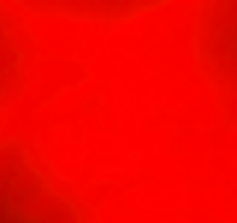

In [87]:
import folium
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import tempfile
from pyproj import Transformer

# Pick a few bands to visualize (e.g., RGB from Sentinel-2 or any 3 continuous bands)
# Make sure these bands exist and are not all zero
rgb_bands = [0, 1, 2]  # Change indices depending on your data stack

# Get data to plot
visual_array = np.stack([stacked_bands[i] for i in rgb_bands], axis=-1)

# Normalize for display (0-1)
def normalize(arr):
    arr = arr.astype(np.float32)
    min_val = np.nanpercentile(arr, 2)
    max_val = np.nanpercentile(arr, 98)
    return np.clip((arr - min_val) / (max_val - min_val + 1e-5), 0, 1)

rgb_norm = normalize(visual_array)

# Save image temporarily
tmp_img_path = tempfile.mktemp(suffix=".png")
plt.imsave(tmp_img_path, rgb_norm)

# Convert bounds to EPSG:4326
with rasterio.open(base_path) as src:
    bounds = src.bounds
    crs = src.crs

transformer = Transformer.from_crs(crs.to_string(), 'EPSG:4326', always_xy=True)
min_lon, min_lat = transformer.transform(bounds.left, bounds.bottom)
max_lon, max_lat = transformer.transform(bounds.right, bounds.top)

# Create and display the Folium map
center = [(min_lat + max_lat) / 2, (min_lon + max_lon) / 2]
m = folium.Map(location=center, zoom_start=13)

overlay = folium.raster_layers.ImageOverlay(
    name='EO Input Stack (RGB)',
    image=tmp_img_path,
    bounds=[[min_lat, min_lon], [max_lat, max_lon]],
    opacity=0.7,
    interactive=True,
    cross_origin=False,
    zindex=1,
)

overlay.add_to(m)
folium.LayerControl().add_to(m)

# Display the map
m


# Inference

In [88]:
import torch
import numpy as np

# Your input tensor: shape (1, 46, 223, 237)
input_tensor = input_tensor.squeeze(0)  # (46, 223, 237)

H, W = input_tensor.shape[1], input_tensor.shape[2]
num_pixels = H * W

# Flatten spatial dims: (46, H, W) -> (num_pixels, 46)
flat_pixels = input_tensor.reshape(46, -1).permute(1, 0)  # (num_pixels, 46)

# Define EO bands per source (example, adjust to your data)
eo_band_counts = {
    's1': 6,
    'dem': 4,
    'hls': 6,
    'landsat': 6,
    'landsat_idx': 6,
    'tcap': 6,
    's2': 6,
    's2_idx': 6
}

eo_list = list(eo_band_counts.keys())
emb_dim = 64

# Compute cumulative band indices for slicing
band_indices = []
start = 0
for eo in eo_list:
    end = start + eo_band_counts[eo]
    band_indices.append((start, end))
    start = end

# For each pixel, extract embeddings per EO source and pad/trim to emb_dim
all_embeddings = []
for start_idx, end_idx in band_indices:
    eo_bands = flat_pixels[:, start_idx:end_idx]  # shape: (num_pixels, eo_band_count)
    # Pad or trim to emb_dim
    if eo_bands.shape[1] < emb_dim:
        padding = torch.zeros((num_pixels, emb_dim - eo_bands.shape[1]), dtype=eo_bands.dtype)
        eo_emb = torch.cat([eo_bands, padding], dim=1)
    else:
        eo_emb = eo_bands[:, :emb_dim]
    all_embeddings.append(eo_emb.unsqueeze(1))  # shape: (num_pixels, 1, emb_dim)

# Stack embeddings per EO: shape (num_pixels, 8, emb_dim)
fusion_input = torch.cat(all_embeddings, dim=1)

print(f"Fusion input shape (num_pixels, num_eos, emb_dim): {fusion_input.shape}")
# Expected: (223*237, 8, 64) = (num_pixels, 8, 64)

# Move to device
fusion_input = fusion_input.to(device)

# Run inference in batches to avoid memory issues
batch_size = 4096
model.eval()
predictions = []

with torch.no_grad():
    for i in range(0, num_pixels, batch_size):
        batch = fusion_input[i:i+batch_size]
        preds = model(batch)  # Output shape: (batch_size,)a
        predictions.append(preds.cpu())

# Concatenate all predictions
preds_all = torch.cat(predictions)

# Reshape back to raster shape
pred_map = preds_all.reshape(H, W).numpy()
print(f"Pred map min: {pred_map.min()}, max: {pred_map.max()}, mean: {pred_map.mean()}")

print(f"Prediction map shape: {pred_map.shape}")


Fusion input shape (num_pixels, num_eos, emb_dim): torch.Size([52851, 8, 64])
Pred map min: 44.6253547668457, max: 69.50198364257812, mean: 55.643043518066406
Prediction map shape: (223, 237)


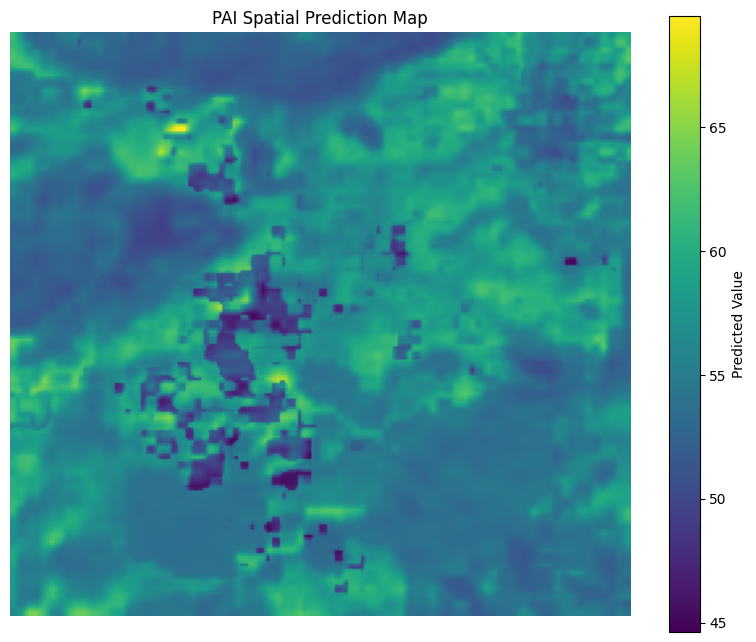

In [89]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.imshow(pred_map, cmap='viridis')
plt.colorbar(label="Predicted Value")
plt.title("PAI Spatial Prediction Map")
plt.axis('off')
plt.show()


In [34]:
import rasterio
from rasterio.transform import from_origin
import os
import numpy as np

# Your predicted map
# pred_map: numpy array of shape (223, 237)

# Save path
output_path = "/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results/predicted_pai_map.tif"

# Assume top-left corner (origin) and 10m resolution
# You can tweak (x_min, y_max) to match your actual location
x_min, y_max = 0, 0  # Change if needed
resolution = 10
transform = from_origin(x_min, y_max, resolution, resolution)

# Save GeoTIFF
with rasterio.open(
    output_path,
    'w',
    driver='GTiff',
    height=pred_map.shape[0],
    width=pred_map.shape[1],
    count=1,
    dtype=pred_map.dtype,
    crs='EPSG:4326',  # Set correct CRS if known (e.g., EPSG:32616 for UTM Zone 16N)
    transform=transform
) as dst:
    dst.write(pred_map, 1)

print(f"✅ Saved predicted map to:\n{output_path}")


✅ Saved predicted map to:
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results/predicted_pai_map.tif
